## Notebook for plotting probabilities and GMM approach

This notebook is dedicated to plotting the probabilities of the predictions, as well as the GMM approach

Library imports

In [16]:
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt
from time import time
use_cuda=True
from torchvision import datasets, transforms
from torch import nn, optim
import time
from scipy.stats import pointbiserialr, pearsonr, spearmanr
from tqdm import tqdm

In [6]:
print("Available CUDA devices:", [torch.cuda.get_device_name(i) for i in range(torch.cuda.device_count())])

Available CUDA devices: ['Quadro RTX 4000']


### Dataset

In [2]:
transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.5,), (0.5,)),
                              ])


trainset = datasets.MNIST('PATH_TO_STORE_TRAINSET', download=True, train=True, transform=transform)
valset = datasets.MNIST('PATH_TO_STORE_TESTSET', download=True, train=False, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
valloader = torch.utils.data.DataLoader(valset, batch_size=64, shuffle=True)



In [3]:
dataiter = iter(trainloader)
images, labels = next(dataiter)

print(images.shape)
print(labels.shape)

torch.Size([64, 1, 28, 28])
torch.Size([64])


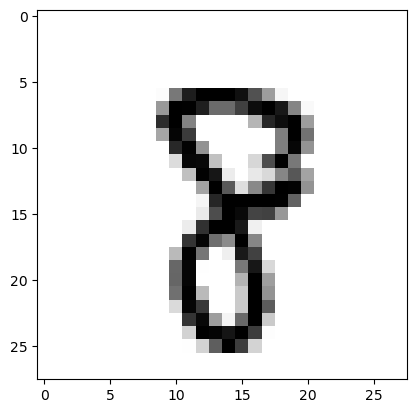

In [4]:
plt.imshow(images[0].numpy().squeeze(), cmap='gray_r');


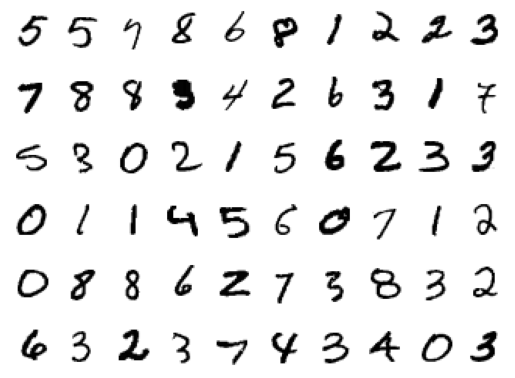

In [5]:
figure = plt.figure()
num_of_images = 60
for index in range(1, num_of_images + 1):
    plt.subplot(6, 10, index)
    plt.axis('off')
    plt.imshow(images[index].numpy().squeeze(), cmap='gray_r')
    

In [7]:
def train_model(model, trainloader, criterion, optimizer, epochs=15, device='cuda'):
    time0 = time.time()

    for e in range(epochs):
        running_loss = 0
        for images, labels in trainloader:
            images, labels = images.to(device), labels.to(device)
            # Flatten MNIST images into a 784 long vector
            images = images.view(images.shape[0], -1)

            # Training pass
            optimizer.zero_grad()

            output = model(images)
            loss = criterion(output, labels)

            # This is where the model learns by backpropagating
            loss.backward()

            # And optimizes its weights here
            optimizer.step()

            running_loss += loss.item()
        else:
            print("Epoch {} - Training loss: {}".format(e, running_loss/len(trainloader)))

    print("\nTraining Time (in minutes) =", (time.time()-time0)/60)

In [9]:
def extract_node_value_ranges(model, num_nodes_per_layer, trim, n_std):
    if trim == True:
        model.trim_node_values(n_std)
        node_dict = model.node_dict_trimmed
        sum_dict_original = sum(len(value) for layer in model.node_dict.values() for value in layer.values())
        sum_dict_trimmed = sum(len(value) for layer in model.node_dict_trimmed.values() for value in layer.values())
        print("Original = ", sum_dict_original, "node values")
        print("Trimmed = ", sum_dict_trimmed, "node values")
        print("Values removed =", sum_dict_original-sum_dict_trimmed)
        print("Percentage of nodes removed", 100*(sum_dict_original-sum_dict_trimmed)/sum_dict_original)
    else:
        node_dict = model.node_dict
    interval_dict = create_network_dict(num_nodes_per_layer=num_nodes_per_layer)
    for layer, subdict in node_dict.items():
        for node, values in subdict.items():
            min_values = min(values)
            max_values = max(values)
            interval_dict[layer][node] = [min_values, max_values]
    return interval_dict

In [10]:
def evaluate_model(model, valloader, trim = False, n_std = 2):
    device='cuda'
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_node_value_ranges(model, num_nodes_per_layer=hidden_sizes, trim = trim, n_std = n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                for layer, subdict in model.node_dict_testing.items():
                    for node, values in subdict.items():
                        min_value, max_value = value_ranges[layer][node]
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                probab_list.append(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list



In [43]:
def evaluate_model(model, valloader, trim = False, n_std = 2):
    device='cuda'
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_node_value_ranges(model, num_nodes_per_layer=hidden_sizes, trim = trim, n_std = n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                for layer, subdict in model.node_dict_testing.items():
                    for node, values in subdict.items():
                        min_value, max_value = value_ranges[layer][node]
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()
                probab_list.append(probab[true_label])
                

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list

In [12]:
def plot_percentage_scatter(percentages, correct_predictions, num_points=None, ymin=0, ymax=102, title = None):
    
    
    data_points = [{'percentage_true': percent, 'correct_prediction': correct} for percent, correct in zip(percentages[:num_points], correct_predictions[:num_points])]

    percentages = [point['percentage_true'] for point in data_points]
    correct_predictions = [point['correct_prediction'] for point in data_points]

    # Plot points
    plt.figure(figsize=(12, 6))

    #progress_bar = tqdm(total=len(percentages), desc='Plotting')

    for i, (percent, correct) in enumerate(zip(percentages, correct_predictions)):
        marker = 'o' if correct else '^'
        color = 'green' if correct else 'red'
        plt.scatter(i + 1, percent, marker=marker, color=color, s=10, alpha=0.7)

        # Update the progress bar
        #progress_bar.update(1)
        #time.sleep(0.01)

    #progress_bar.close()

    plt.xlabel('Predictions')
    plt.ylabel('Percentage of True Nodes')
    if title == None:
        title = 'Scatter Plot of Percentage of True Nodes for Different Scenarios'
    plt.title(title)
    plt.ylim(ymin, ymax)

    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10),
                      plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='red', markersize=10)]
    legend_labels = ['Correct Prediction', 'Incorrect Prediction']

    # Show the legend with custom handles and labels
    plt.legend(handles=legend_handles, labels=legend_labels)

    # Show the plot
    plt.show()

In [13]:
def plot_percentage_scatter_probab(percentages, correct_predictions, probabs, num_points=None, ymin=0, ymax=102, title = None):

    # Plot points
    plt.figure(figsize=(12, 6))

    #progress_bar = tqdm(total=len(percentages), desc='Plotting')

    for i, (percent, correct) in enumerate(zip(percentages, correct_predictions)):
        marker = 'o' if correct else '^'
        color = 'green' if correct else 'red'
        plt.scatter(i + 1, percent, marker=marker, color=color, s=10, alpha=0.7)

        # Update the progress bar
        #progress_bar.update(1)
        #time.sleep(0.01)

    #progress_bar.close()

    plt.xlabel('Predictions')
    plt.ylabel('Percentage of True Nodes')
    if title == None:
        title = 'Scatter Plot of Percentage of True Nodes for Different Scenarios'
    plt.title(title)
    plt.ylim(ymin, ymax)

    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10),
                      plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='red', markersize=10)]
    legend_labels = ['Correct Prediction', 'Incorrect Prediction']

    # Show the legend with custom handles and labels
    plt.legend(handles=legend_handles, labels=legend_labels)

    # Show the plot
    plt.show()

In [41]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def plot_predictions_scatter(ax, probabs, percentages, color_map, title, ymin=0, ymax=102):
    scatter = ax.scatter(range(len(probabs)), percentages, c=probabs, cmap=color_map, vmin=0, vmax=1)
    plt.colorbar(scatter, ax=ax, label='Probability')  # Add colorbar
    ax.set_xlabel('Predictions')
    ax.set_ylabel('Percentage of True Nodes')
    ax.set_title(title)
    ax.set_ylim(ymin, ymax)

def plot_percentage_scatter_probab(percentages, correct_predictions, probabs, num_points=None, title=None, ymin=0, ymax=102, k = 1):
    data_points = [{'percentage_true': percent, 'correct_prediction': correct, "probabs": probability} 
                   for percent, correct, probability in zip(percentages[:num_points], correct_predictions[:num_points], probabs[:num_points])]
    
    # Separate correct and incorrect predictions
    correct_data = [point for point in data_points if point['correct_prediction']]
    incorrect_data = [point for point in data_points if not point['correct_prediction']]
    
    # Define custom colormaps
    blue_yellow_cmap = LinearSegmentedColormap.from_list("blue_yellow_cmap", [(0, 'yellow'), (1, 'blue')])
    red_yellow_cmap = LinearSegmentedColormap.from_list("red_yellow_cmap", [(0, 'yellow'), (1, 'red')])
    coolwarm_cmap = plt.cm.coolwarm
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot correct predictions
    plot_predictions_scatter(axs[0], [point['probabs'] for point in correct_data], 
                             [point['percentage_true'] for point in correct_data], 
                             blue_yellow_cmap, 
                             f"Correct Predictions (k={k})", ymin, ymax)
    
    # Plot incorrect predictions
    plot_predictions_scatter(axs[1], [point['probabs'] for point in incorrect_data], 
                             [point['percentage_true'] for point in incorrect_data], 
                             coolwarm_cmap, 
                             f"Incorrect Predictions (k={k})", ymin, ymax)
    
    plt.tight_layout()
    plt.show()



In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def plot_predictions_scatter(probabs, percentages, color_map, title, ymin=0, ymax=102):
    plt.figure(figsize=(8, 6))
    plt.scatter(range(len(probabs)), percentages, c=probabs, cmap=color_map, vmin=0, vmax=1)
    plt.colorbar(label='Probability')
    plt.xlabel('Predictions')
    plt.ylabel('Percentage of True Nodes')
    plt.title(title)
    plt.ylim(ymin, ymax)
    plt.show()

def plot_percentage_scatter_probab(percentages, correct_predictions, probabs, num_points=None, title=None, ymin=0, ymax=102, k=1):
    data_points = [{'percentage_true': percent, 'correct_prediction': correct, "probabs": probability} 
                   for percent, correct, probability in zip(percentages[:num_points], correct_predictions[:num_points], probabs[:num_points])]
    
    # Separate correct and incorrect predictions
    correct_data = [point for point in data_points if point['correct_prediction']]
    incorrect_data = [point for point in data_points if not point['correct_prediction']]
    
    # Define custom colormaps
    blue_yellow_cmap = LinearSegmentedColormap.from_list("blue_yellow_cmap", [(0, 'yellow'), (1, 'blue')])
    red_yellow_cmap = LinearSegmentedColormap.from_list("red_yellow_cmap", [(0, 'yellow'), (1, 'red')])
    
    # Plot correct predictions
#     plot_predictions_scatter([point['probabs'] for point in correct_data], 
#                              [point['percentage_true'] for point in correct_data], 
#                              blue_yellow_cmap, 
#                              f"Correct Predictions (k={k})", ymin, ymax)
    
    # Plot incorrect predictions
#     plot_predictions_scatter([point['probabs'] for point in incorrect_data], 
#                              [point['percentage_true'] for point in incorrect_data], 
#                              plt.cm.coolwarm, 
#                              f"Incorrect Predictions (k={k})", ymin, ymax)
    
    p, pvalue_p, s, pvalue_s = find_corr([point['percentage_true'] for point in incorrect_data], [point['probabs'] for point in incorrect_data])
    correlation_list.append((p, pvalue_p, s, pvalue_s))
    for i, tup in enumerate(correlation_list):
        print(f"For std = {k}, pearson correlation = {p} with pvalue {pvalue_p}")
        print(f"For std = {k}, spearman correlation = {s} with pvalue value_s")
    
    

# # Example usage
# percentages = np.random.randint(50, 100, 100)
# correct_predictions = np.random.choice([True, False], 100)
# probabs = np.random.rand(100)

# plot_percentage_scatter_probab(percentages, correct_predictions, probabs, title="Custom Scatter Plot", ymin=40, ymax=110)


In [35]:
def find_corr(array_v, array_bool):
  numeric_boolean_values = array_bool
  pearson_corr, pearson_p_value = pearsonr(array_v, numeric_boolean_values)
  spearman_corr, spearman_p_value = spearmanr(array_v, numeric_boolean_values)
  return pearson_corr, pearson_p_value, spearman_corr, spearman_p_value

# Sigmoid Model

In [15]:
input_size = 784
hidden_sizes = [128, 64]
output_size = 10

def create_network_dict(num_nodes_per_layer):
    network_dict = {}
    for layer in range(1, len(num_nodes_per_layer) + 1):
        layer_name = f"Layer{layer}"
        network_dict[layer_name] = {f"node{i}": [] for i in range(num_nodes_per_layer[layer - 1])}
    return network_dict

class MyModel_sigmoid(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
        super(MyModel_sigmoid, self).__init__()

        self.layer1 = nn.Linear(input_size, hidden_sizes[0])
        self.sigmoid1 = nn.Sigmoid()
        self.layer2 = nn.Linear(hidden_sizes[0], hidden_sizes[1])
        self.sigmoid2 = nn.Sigmoid()
        self.layer3 = nn.Linear(hidden_sizes[1], output_size)
        self.log_softmax = nn.LogSoftmax(dim=1)
        self.node_dict = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.node_dict_testing = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.testing = False
        self.hidden_sizes = hidden_sizes
        self.node_dict_trimmed = create_network_dict(num_nodes_per_layer=hidden_sizes)
        self.record = True

    def record_node_values(self, x, layer, hidden_sizes, record):
        if record:
            if self.testing:
                for j in range(len(x[0])):
                    self.node_dict_testing[f"Layer{layer}"][f"node{j}"].extend(x[:, j].detach().cpu().numpy())
            else:
                for j in range(len(x[0])):
                    self.node_dict[f"Layer{layer}"][f"node{j}"].extend(x[:, j].detach().cpu().numpy())

    def forward(self, x):
        layer = 1
        x = self.sigmoid1(self.layer1(x))
        self.record_node_values(x, layer, hidden_sizes, self.record)
        layer+=1
        x = self.sigmoid2(self.layer2(x))
        self.record_node_values(x, layer, hidden_sizes, self.record)
        x = self.log_softmax(self.layer3(x))
        return x

    def reset_testing_dict(self):
        self.node_dict_testing = create_network_dict(num_nodes_per_layer=hidden_sizes)
        
    def trim_node_values(self, n_std = 2):
        for layer, subdict in self.node_dict.items():
            for node, values in subdict.items():
                values_array = np.array(values)
                mean = np.mean(values_array)
                std = np.std(values_array)
                filtered_values_array = values_array[(mean - n_std * std <= values_array) & (values_array <= mean + n_std * std)].tolist()
                self.node_dict_trimmed[layer][node] = filtered_values_array
                       
    

model_sigmoid = MyModel_sigmoid(input_size, hidden_sizes, output_size)
device = torch.device('cuda')  # use cuda or cpu
model_sigmoid.to(device)
print(model_sigmoid)
optimizer = optim.SGD(model_sigmoid.parameters(), lr=0.003, momentum=0.9)
criterion = nn.NLLLoss()
train_model(model_sigmoid, trainloader, criterion, optimizer, epochs=15)

MyModel_sigmoid(
  (layer1): Linear(in_features=784, out_features=128, bias=True)
  (sigmoid1): Sigmoid()
  (layer2): Linear(in_features=128, out_features=64, bias=True)
  (sigmoid2): Sigmoid()
  (layer3): Linear(in_features=64, out_features=10, bias=True)
  (log_softmax): LogSoftmax(dim=1)
)
Epoch 0 - Training loss: 2.262371665124954
Epoch 1 - Training loss: 1.6789576705457814
Epoch 2 - Training loss: 0.8787918156271042
Epoch 3 - Training loss: 0.6022438930867832
Epoch 4 - Training loss: 0.47433713259600374
Epoch 5 - Training loss: 0.4101741313140021
Epoch 6 - Training loss: 0.3711979009830621
Epoch 7 - Training loss: 0.34377355744907345
Epoch 8 - Training loss: 0.3221312400692307
Epoch 9 - Training loss: 0.3041392763746954
Epoch 10 - Training loss: 0.2880848889618413
Epoch 11 - Training loss: 0.27411143484908634
Epoch 12 - Training loss: 0.2610166434254219
Epoch 13 - Training loss: 0.248325728666363
Epoch 14 - Training loss: 0.23732515417738384

Training Time (in minutes) = 4.1211229

### Probabilities

In [44]:
accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list_sigmoid = evaluate_model(model_sigmoid, valloader, trim = False, n_std = 2)
print(f"Model Accuracy = {accuracy_sigmoid * 100}%")

Model Accuracy = 93.47999999999999%


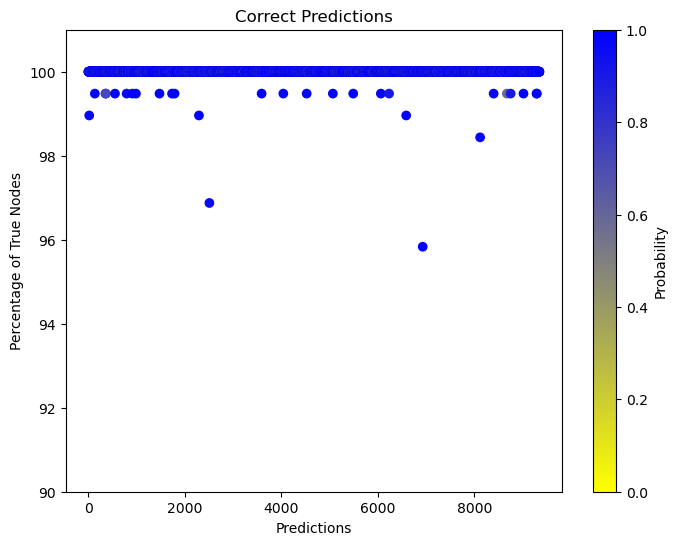

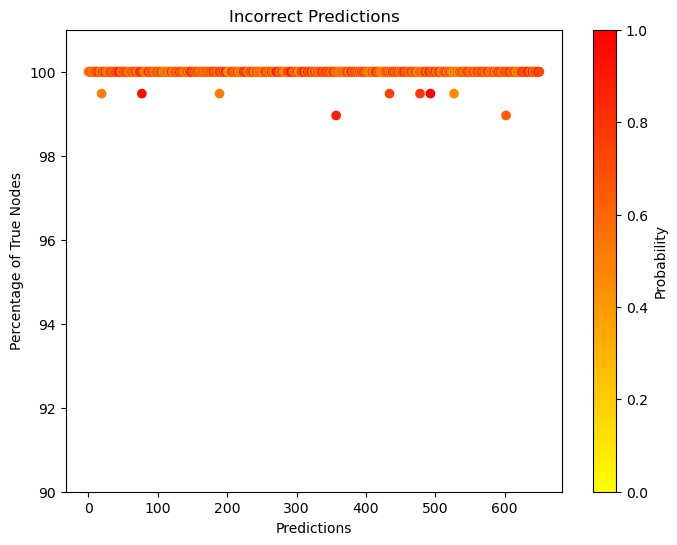

In [73]:
plot_percentage_scatter_probab(percent_list_sigmoid, prediction_list_sigmoid, probab_list_sigmoid, ymin=90, ymax=101,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model")

In [48]:
pearsonr(percent_list_sigmoid_trimmed, probab_list_sigmoid)

PearsonRResult(statistic=0.009443064140470513, pvalue=0.3450626430221817)

### Trimming using mean and std

In [50]:
k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# k_list = [1.5]
correlation_list=[]
for k in k_list:
    accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model(model_sigmoid, 
                                                                                                             valloader, trim = True, 
                                                                                                             n_std = k)
    plot_percentage_scatter_probab(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
                       title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)

Original =  172800000 node values
Trimmed =  48665743 node values
Values removed = 124134257
Percentage of nodes removed 71.8369542824074
For std = 0.5, pearson correlation = -0.09792042412506638 with pvalue 0.012365277929003007
For std = 0.5, spearman correlation = -0.0681441736424607 with pvalue value_s
Original =  172800000 node values
Trimmed =  103381939 node values
Values removed = 69418061
Percentage of nodes removed 40.17248900462963
For std = 1, pearson correlation = -0.08022562588397499 with pvalue 0.040572212477517945
For std = 1, spearman correlation = -0.04355873087537855 with pvalue value_s
For std = 1, pearson correlation = -0.08022562588397499 with pvalue 0.040572212477517945
For std = 1, spearman correlation = -0.04355873087537855 with pvalue value_s
Original =  172800000 node values
Trimmed =  153724546 node values
Values removed = 19075454
Percentage of nodes removed 11.03903587962963
For std = 1.5, pearson correlation = -0.03477227294321903 with pvalue 0.37537526394

In [37]:
k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# k_list = [1.5]
correlation_list=[]
for k in k_list:
    accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model(model_sigmoid, 
                                                                                                             valloader, trim = True, 
                                                                                                             n_std = k)
#     plot_percentage_scatter_probab(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
#                        title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)
    p, pvalue_p, s, pvalue_s = find_corr(percent_list_sigmoid_trimmed, probab_list_sigmoid)
    correlation_list.append((p, pvalue_p, s, pvalue_s))
for i, tup in enumerate(correlation_list):
    print(f"For std = {k_list[i]}, pearson correlation = {tup[0]} with pvalue {tup[1]}")
    print(f"For std = {k_list[i]}, spearman correlation = {tup[2]} with pvalue {tup[3]}")

Original =  172800000 node values
Trimmed =  48665743 node values
Values removed = 124134257
Percentage of nodes removed 71.8369542824074
Original =  172800000 node values
Trimmed =  103381939 node values
Values removed = 69418061
Percentage of nodes removed 40.17248900462963
Original =  172800000 node values
Trimmed =  153724546 node values
Values removed = 19075454
Percentage of nodes removed 11.03903587962963
Original =  172800000 node values
Trimmed =  170166290 node values
Values removed = 2633710
Percentage of nodes removed 1.5241377314814815
Original =  172800000 node values
Trimmed =  172643360 node values
Values removed = 156640
Percentage of nodes removed 0.09064814814814814
Original =  172800000 node values
Trimmed =  172799849 node values
Values removed = 151
Percentage of nodes removed 8.738425925925926e-05
For std = 0.5, pearson correlation = -0.5108227261871612 with pvalue 0.0
For std = 0.5, spearman correlation = -0.6271445210598688 with pvalue 0.0
For std = 1, pearson 

Original =  172800000 node values
Trimmed =  48665743 node values
Values removed = 124134257
Percentage of nodes removed 71.8369542824074


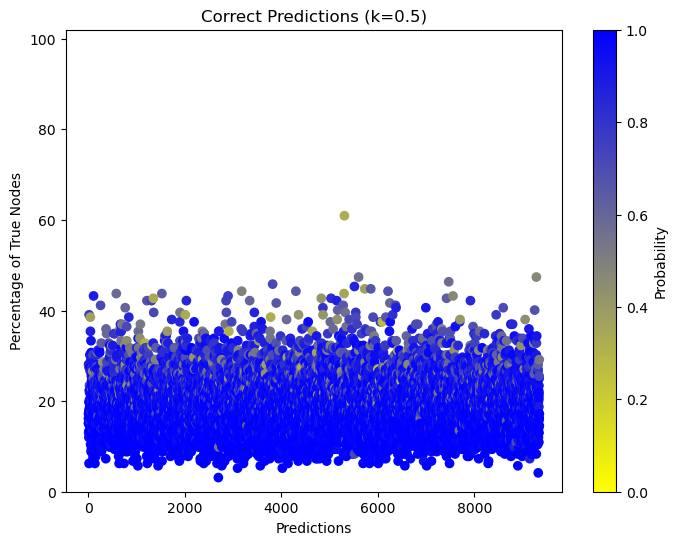

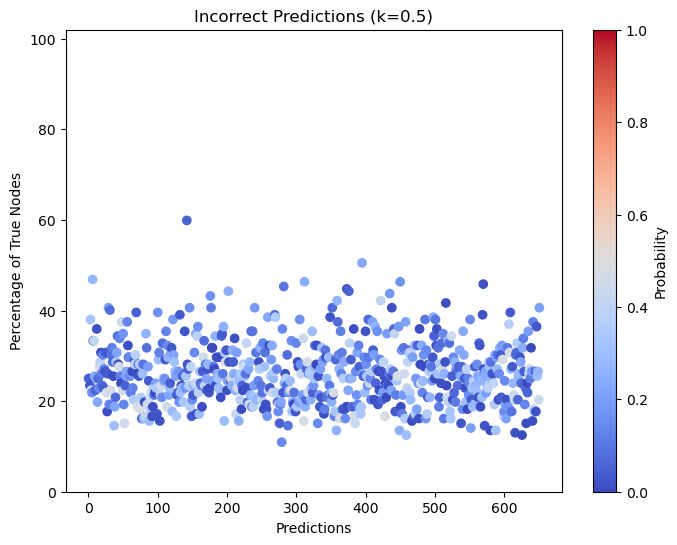

Original =  172800000 node values
Trimmed =  103381939 node values
Values removed = 69418061
Percentage of nodes removed 40.17248900462963


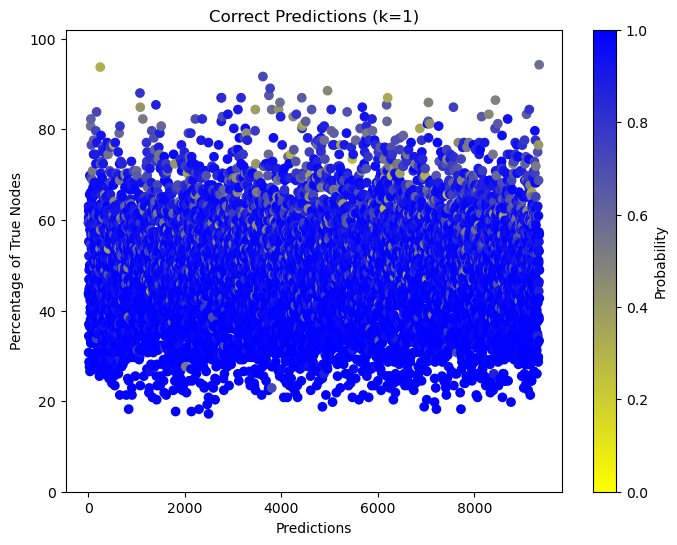

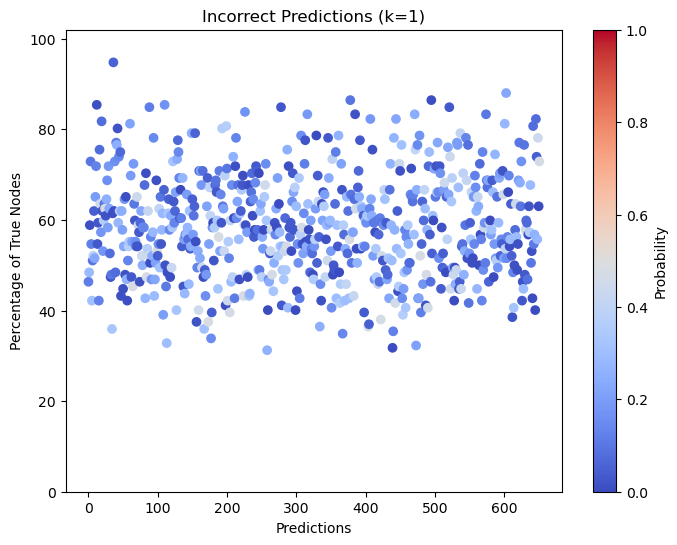

Original =  172800000 node values
Trimmed =  153724546 node values
Values removed = 19075454
Percentage of nodes removed 11.03903587962963


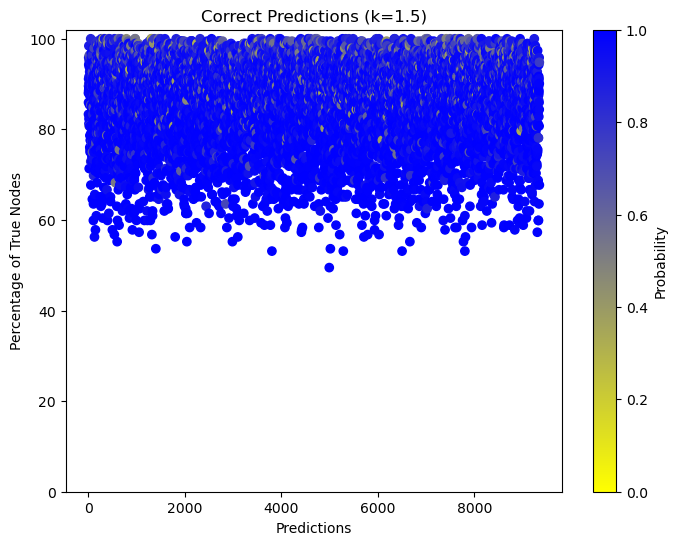

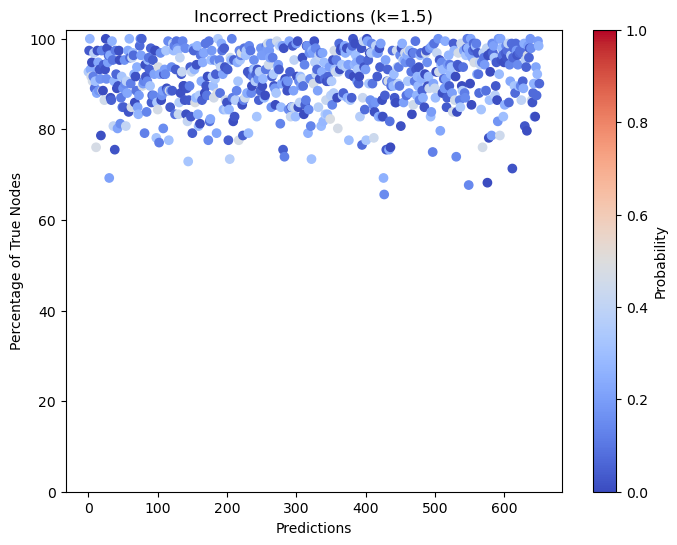

Original =  172800000 node values
Trimmed =  170166290 node values
Values removed = 2633710
Percentage of nodes removed 1.5241377314814815


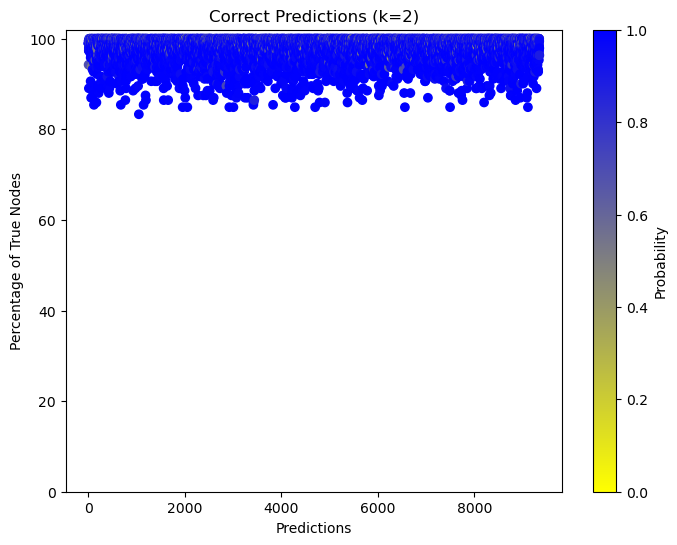

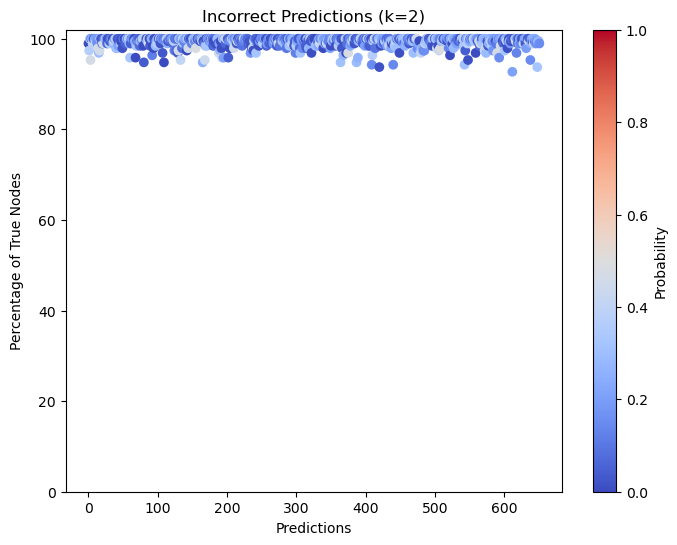

Original =  172800000 node values
Trimmed =  172643360 node values
Values removed = 156640
Percentage of nodes removed 0.09064814814814814


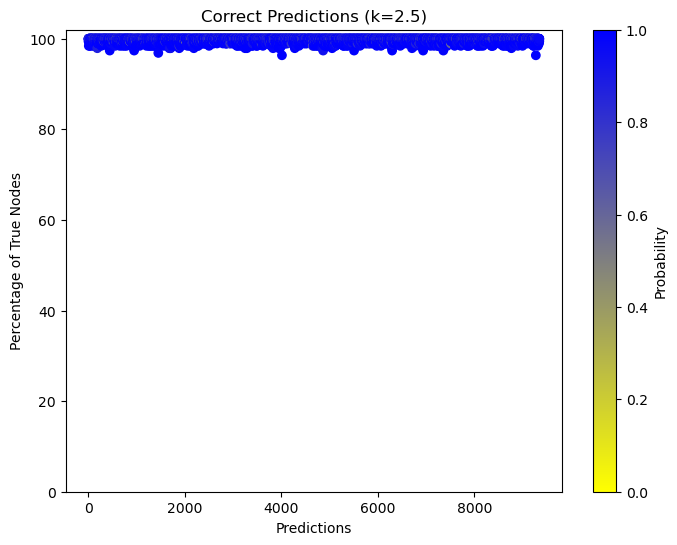

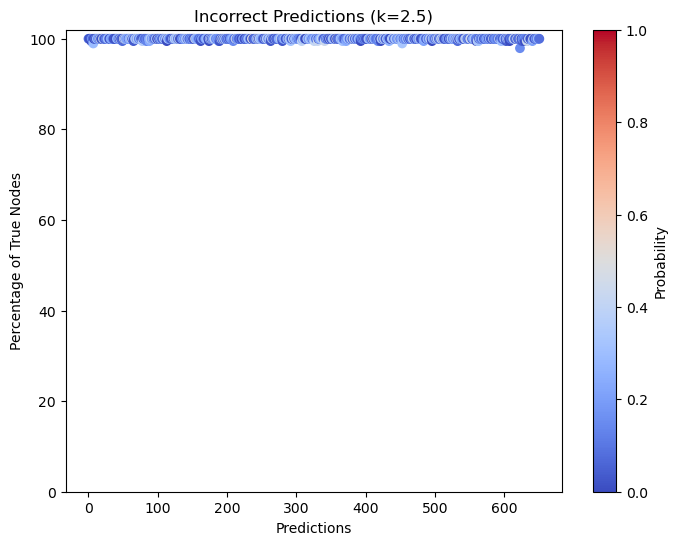

Original =  172800000 node values
Trimmed =  172799849 node values
Values removed = 151
Percentage of nodes removed 8.738425925925926e-05


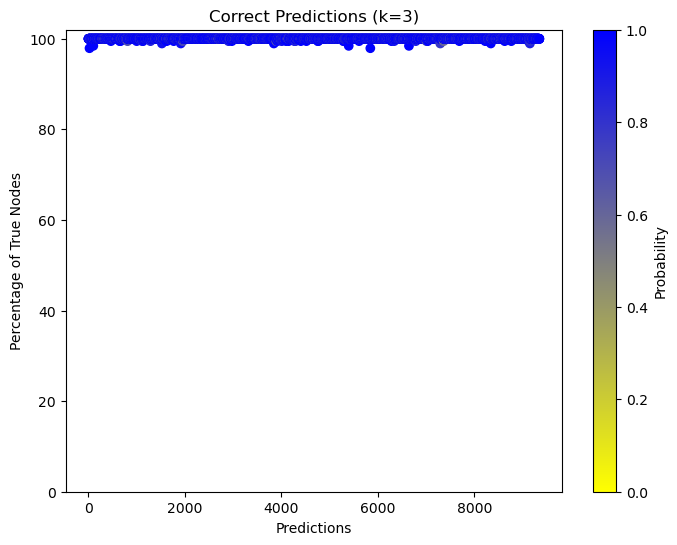

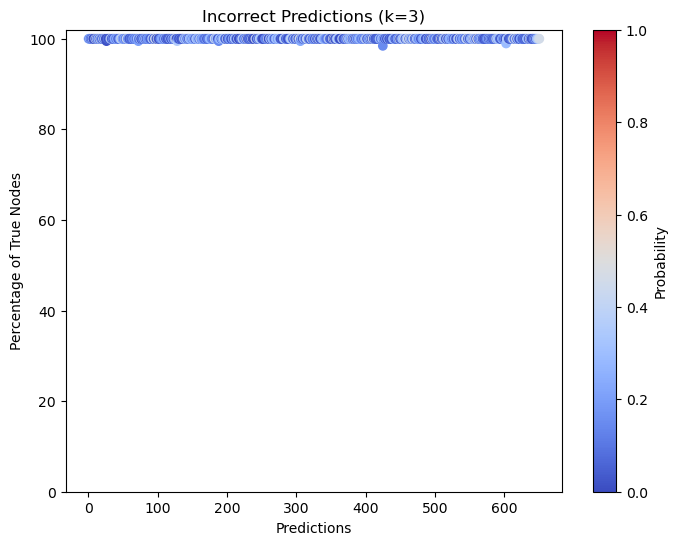

For std = 0.5, pearson correlation = -0.44722543386480523 with pvalue 0.0
For std = 0.5, spearman correlation = -0.6234380767011104 with pvalue 0.0
For std = 1, pearson correlation = -0.37254713747484614 with pvalue 0.0
For std = 1, spearman correlation = -0.5845605841518056 with pvalue 0.0
For std = 1.5, pearson correlation = -0.2738663571175038 with pvalue 1.5845043032528136e-171
For std = 1.5, spearman correlation = -0.5066229459590732 with pvalue 0.0
For std = 2, pearson correlation = -0.22325410671831197 with pvalue 3.5710399178066263e-113
For std = 2, spearman correlation = -0.45673961221489967 with pvalue 0.0
For std = 2.5, pearson correlation = -0.15177769169419844 with pvalue 1.3207721974307127e-52
For std = 2.5, spearman correlation = -0.32434336672686265 with pvalue 1.1805911582412135e-243
For std = 3, pearson correlation = 0.009443064140470513 with pvalue 0.3450626430221817
For std = 3, spearman correlation = -0.008707989233566655 with pvalue 0.38391438810200507


In [47]:
k_list = [0.5, 1, 1.5, 2, 2.5, 3]
# k_list = [1.5]
correlation_list=[]
for k in k_list:
    accuracy_sigmoid_trimmed, percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed, probab_list_sigmoid = evaluate_model(model_sigmoid, 
                                                                                                             valloader, trim = True, 
                                                                                                             n_std = k)
    plot_percentage_scatter_probab(percent_list_sigmoid_trimmed, prediction_list_sigmoid_trimmed,probab_list_sigmoid, num_points=None, ymin=0, ymax=102,
                       title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with trimmed node values(std={k})", k=k)
    p, pvalue_p, s, pvalue_s = find_corr(percent_list_sigmoid_trimmed, probab_list_sigmoid)
    correlation_list.append((p, pvalue_p, s, pvalue_s))
for i, tup in enumerate(correlation_list):
    print(f"For std = {k_list[i]}, pearson correlation = {tup[0]} with pvalue {tup[1]}")
    print(f"For std = {k_list[i]}, spearman correlation = {tup[2]} with pvalue {tup[3]}")

## Gaussian Mixture Models

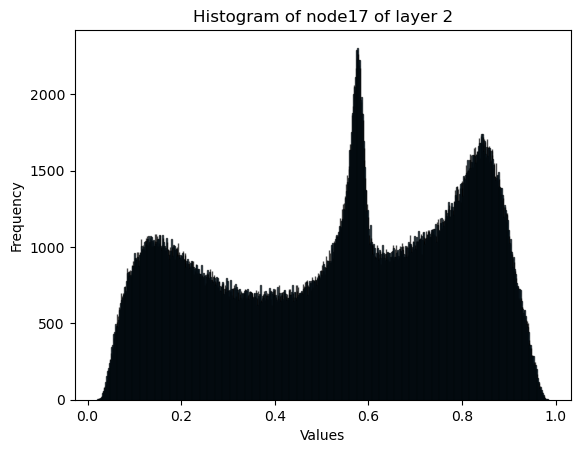

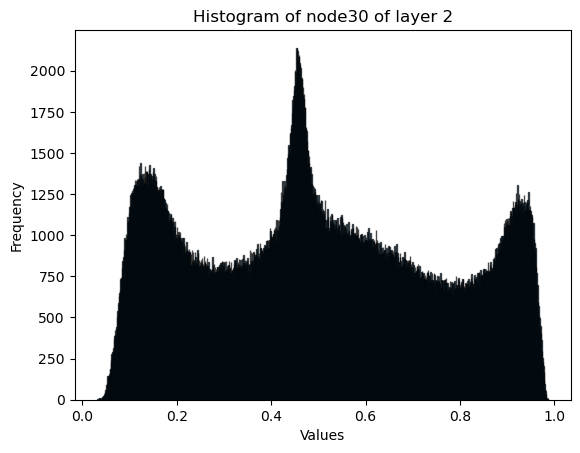

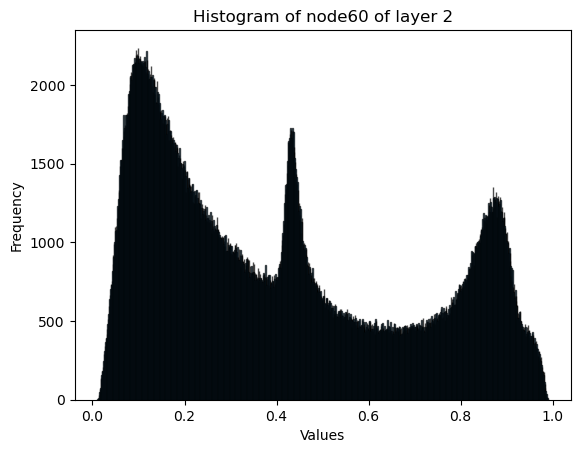

In [57]:
k_list = [17, 30, 60]

for k in k_list:

        # Determine the range of data
        data_min = min(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        data_max = max(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        step_size = 0.001

        # Calculate the number of bins needed
        num_bins = int((data_max - data_min) / step_size) + 1

        # Generate bins with adjusted range and step size
        bins = np.linspace(data_min, data_max, num_bins)

        # Plot the histogram
        plt.hist(model_sigmoid.node_dict["Layer2"][f"node{k}"], bins=bins, edgecolor='black', alpha=0.7)

        # Set labels and title for the plot
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title(f'Histogram of node{k} of layer 2')

        # Show the plot
        plt.show()


Here, we compute the AIC and the BIC scores:
We define $k$ as the number of independent variables to build model, $L$L the maximum likelihood estimate of model, and $n$ the sample size.

- AIC $=2k - 2\log(L)$
- BIC $= \log(n)k - 2\log(L)$

In [16]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.arange(6) + 1

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for i in [17, 30, 60]:
    X = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()


In [ ]:
for i in [17, 30, 60]:
    plt.figure(figsize=(7.5, 5))  # Set the figure size
    plt.plot(k_arr, BIC_by_node[i])  # Plot BIC values for the current node
    plt.title(f'Node {i} BIC')  # Set the title
    plt.xlabel('Number of Components (d)')  # Set x-axis label
    plt.ylabel('BIC')  # Set y-axis label
    plt.tight_layout()  # Adjust layout
    plt.show()  # Show the plot

In [42]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.arange(10) + 1

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for node_key in model_sigmoid.node_dict["Layer2"].keys():
    X = np.array(model_sigmoid.node_dict["Layer2"][node_key]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()


## AIC

In [28]:
AIC_by_node[38]

[57802.78419707965,
 24239.116484629994,
 99059.43107613592,
 86484.63741159227,
 50119.823130050594,
 58496.770776847785]

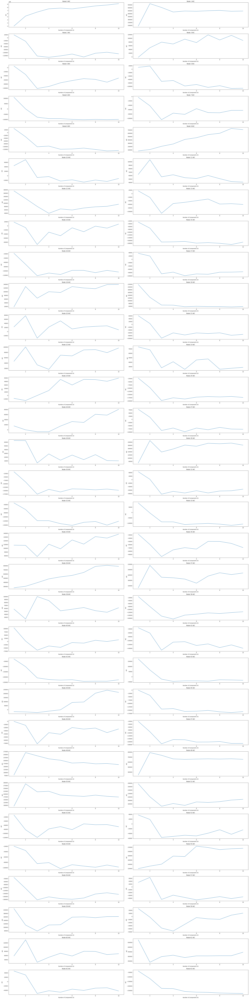

In [45]:
fig, axs = plt.subplots(32, 2, figsize=(30, 120)) 

for i, ax in enumerate(axs.flat):
    ax.plot(k_arr, AIC_by_node[i])
    ax.set_title(f'Node {i} AIC')
    ax.set_xlabel('Number of Components (k)')  # Set x-axis label
    ax.set_ylabel('AIC')  # Set y-axis label
        
plt.tight_layout()

## BIC

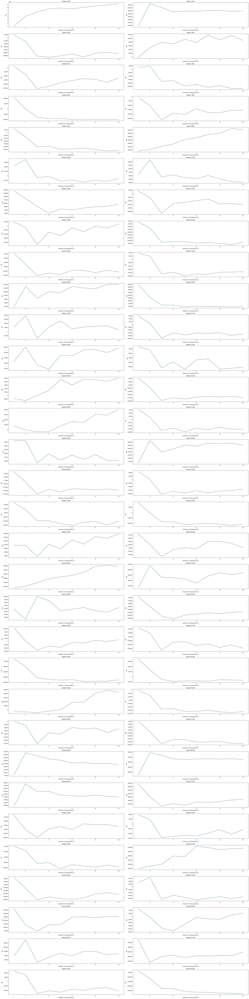

In [46]:
fig, axs = plt.subplots(32, 2, figsize=(30, 120)) 

for i, ax in enumerate(axs.flat):
    ax.plot(k_arr, BIC_by_node[i])
    ax.set_title(f'Node {i} BIC')
    ax.set_xlabel('Number of Components (k)')  # Set x-axis label
    ax.set_ylabel('BIC')  # Set y-axis label
        
plt.tight_layout()

We check if the k that minimizes the AIC is the same as the one minimizing BIC

In [20]:
T = 0
F = 0
for i in range(len(AIC_by_node)):
    if np.argmin(AIC_by_node[i]) == np.argmin(BIC_by_node[i]):
        T+=1
    else:
        F+=1
print("AIC = BIC", T)
print("AIC != BIC", F)
    

AIC = BIC 64
AIC != BIC 0


In [39]:
AIC_by_node[38]

[57802.78419707965,
 24208.913109023193,
 99494.81267377021,
 86382.26007799245,
 50124.73612522484,
 55478.90249767583,
 63240.69001855737]

In [38]:
best_models_by_node[38]

GaussianMixture(n_components=2)

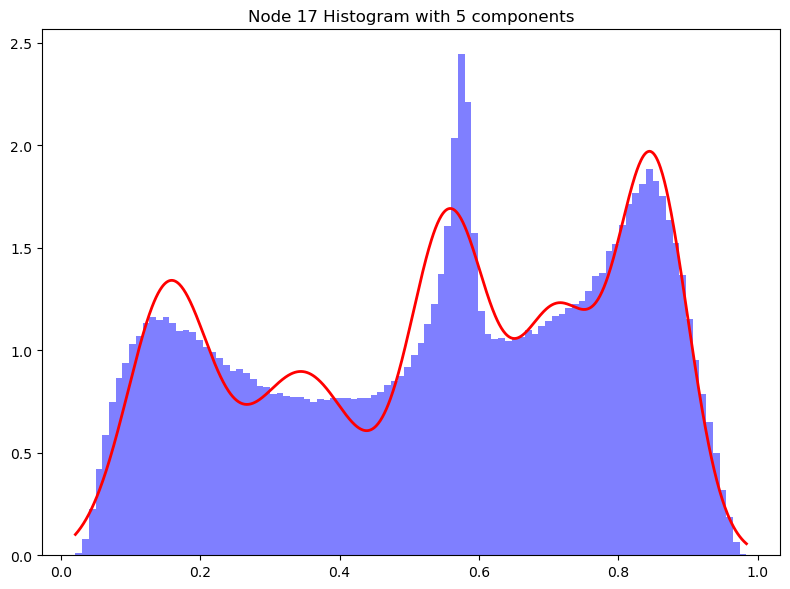

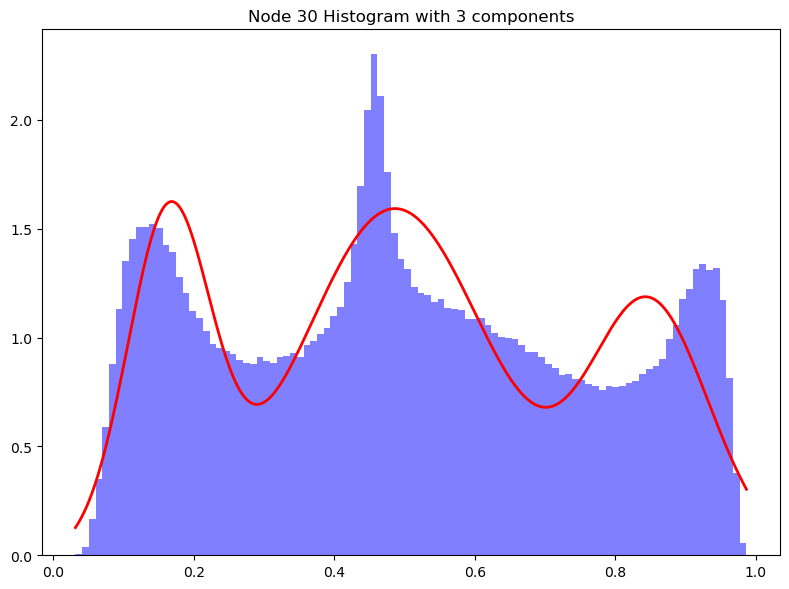

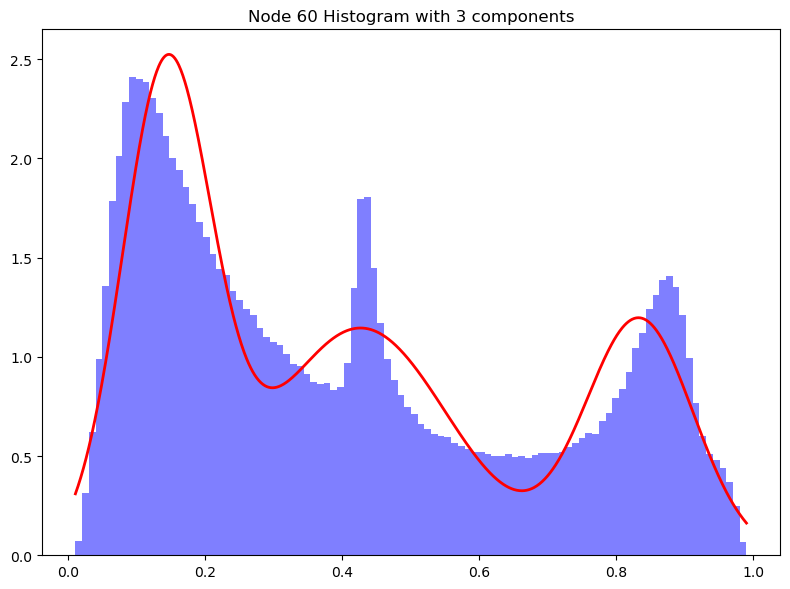

In [54]:
l = [17, 30, 60]

for i in l:
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    best_model = best_models_by_node[i]

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

    plt.tight_layout()
    plt.show()

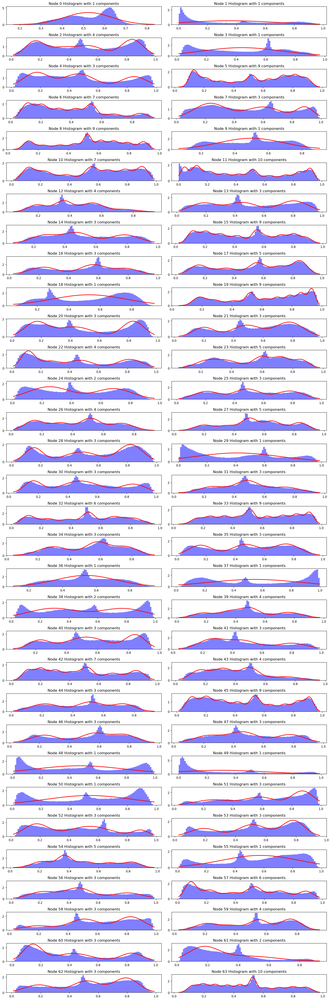

In [47]:
# Plotting
fig, axes = plt.subplots(32, 2, figsize=(15, 45), dpi=100)
axes = axes.flatten()  
for i, (models_for_node, ax) in enumerate(zip(models_by_node, axes)):
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    best_model = best_models_by_node[i]
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

plt.tight_layout()
plt.show()

l = [16, 30, 60]


We now extract the normal distributions' parameters to create confidence intervals

We construct confidence intervals based on the formula

$$
\mu \pm k*\sigma
$$ 
where $k$ is a constant



In [22]:

node_num = 0
k = 1
print("Node number =", node_num)
print('\n')
num_components = best_models_by_node[node_num].n_components
print("Number of components", num_components)
print('\n')
means = best_models_by_node[node_num].means_
print("means", best_models_by_node[node_num].means_)
print('\n')
print("variances", best_models_by_node[node_num].covariances_)
print("\n")
sd = np.sqrt(best_models_by_node[node_num].covariances_)
print("standard deviations", sd )
ranges = [[(means[i]-k*sd[i]).item(),(means[i]+k*sd[i]).item()] for i in range(num_components)]
print("\n")
print("k =",k)
print("ranges = mean +- k*sd \n", ranges)

Node number = 0


Number of components 4


means [[0.38325957]
 [0.64174367]
 [0.12966368]
 [0.84978423]]


variances [[[0.00613702]]

 [[0.00775055]]

 [[0.00382617]]

 [[0.00459753]]]


standard deviations [[[0.07833914]]

 [[0.08803723]]

 [[0.06185603]]

 [[0.06780509]]]


k = 1
ranges = mean +- k*sd 
 [[0.30492043424408033, 0.4615987141496438], [0.5537064371177833, 0.7297808943784125], [0.06780765116914902, 0.19151970764744938], [0.7819791414174875, 0.9175893270101365]]


In [58]:
def extract_ranges_gmm(models, n_std=1):
        node_dict = {"Layer2":None}
        node_dict["Layer2"] = {f"node{i}": [] for i in range(64)}
        for node_num in range(len(models)):
            num_components = models[node_num].n_components
            means = models[node_num].means_
            sd = np.sqrt(models[node_num].covariances_)
            ranges = [[(means[i]-n_std*sd[i]).item(),(means[i]+n_std*sd[i]).item()] for i in range(num_components)]
            node_dict["Layer2"][f"node{node_num}"] = ranges
        return node_dict
        
node_dict_gmm = extract_ranges_gmm(best_models_by_node, n_std = 1)


In [59]:
def evaluate_model_gmm(neuralnet, gmm_models, valloader, n_std = 2):
    device='cuda'
    k=0
    model = neuralnet
    hidden_sizes = model.hidden_sizes
    value_ranges = extract_ranges_gmm(gmm_models, n_std= n_std)
    model.eval()
    model.testing = True
    model.reset_testing_dict()
    node_count = np.sum([len(subdict) for subdict in model.node_dict_testing.values()])

    correct_count, all_count = 0, 0
    percent_list = []
    prediction_list = []
    probab_list = []
    

    for images, labels in valloader:
        images, labels = images.to(device), labels.to(device)

        for index_to_test in range(images.shape[0]):
            img = images[index_to_test].view(1, -1)

            with torch.no_grad():
                logps = model(img)

                true_count = 0
                subdict = model_sigmoid.node_dict_testing.get("Layer2", {})
                for node, values in subdict.items():
                    for rang in value_ranges["Layer2"][node]:
                        if k <5:
                            print("rang", rang, "value", values[all_count])
                            k+=1
                        min_value, max_value = rang
                        if min_value <= values[all_count] <= max_value:
                            true_count += 1

                all_count += 1
                percent_true = true_count / node_count * 100
                percent_list.append(percent_true)
                true_count = 0

                ps = torch.exp(logps)
                probab = list(ps.detach().cpu().numpy()[0])
                pred_label = probab.index(max(probab))
                probab_list.append(max(probab))
                true_label = labels[index_to_test].detach().cpu().numpy()

                if true_label == pred_label:
                    prediction_list.append(True)
                    correct_count += 1
                else:
                    prediction_list.append(False)

    accuracy = correct_count / all_count if all_count > 0 else 0.0
    return accuracy, percent_list, prediction_list, probab_list



In [34]:
for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

k =  0.5 has correlation -0.10327120431821069 and pvalue 4.03372528584278e-25
k =  1 has correlation -0.1174609610931415 and pvalue 4.6396824663877783e-32
k =  1.5 has correlation -0.10217051487248582 and pvalue 1.2777403899857543e-24
k =  2 has correlation -0.13052253937732897 and pvalue 3.013333661548426e-39
k =  2.5 has correlation -0.1629653514377083 and pvalue 1.782574058870042e-60
k =  3 has correlation -0.16903789300161245 and pvalue 5.421961208661646e-65


rang [0.46756404609810986, 0.5782180042441851] value 0.31220558
rang [0.20510702361069427, 0.50917441312443] value 0.0044060033
rang [0.48780016539027643, 0.5874228040519616] value 0.70542914
rang [0.1309765978991329, 0.1958039922586644] value 0.70542914
rang [0.8007483566682404, 0.8756304608574769] value 0.70542914
Model Accuracy = 93.49%


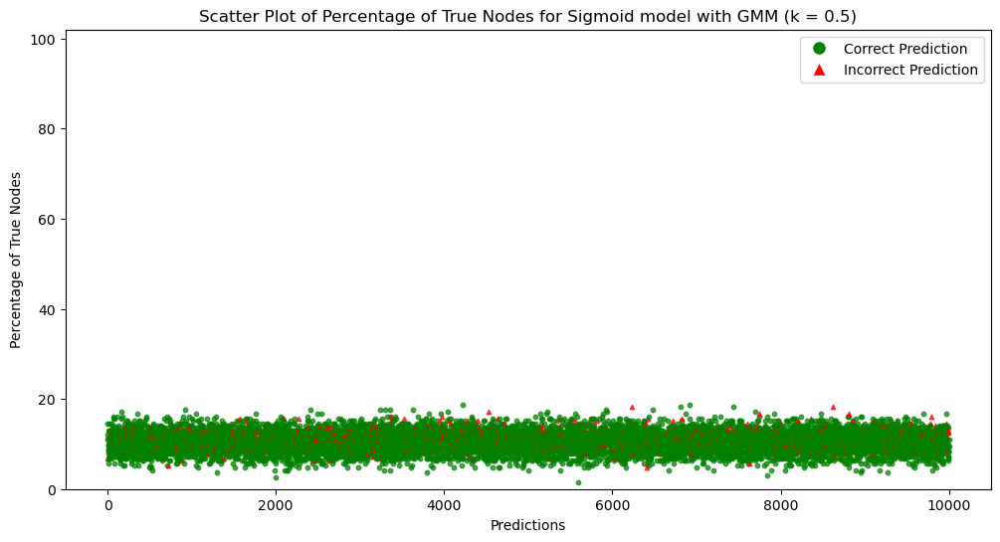

rang [0.41223706702507223, 0.6335449833172228] value 0.570935
rang [0.053073328853826374, 0.6612081078812979] value 0.14466742
rang [0.4379888460594339, 0.637234123382804] value 0.8081743
rang [0.09856290071936716, 0.22821768943843015] value 0.8081743
rang [0.7633073045736221, 0.9130715129520952] value 0.8081743
Model Accuracy = 93.49%


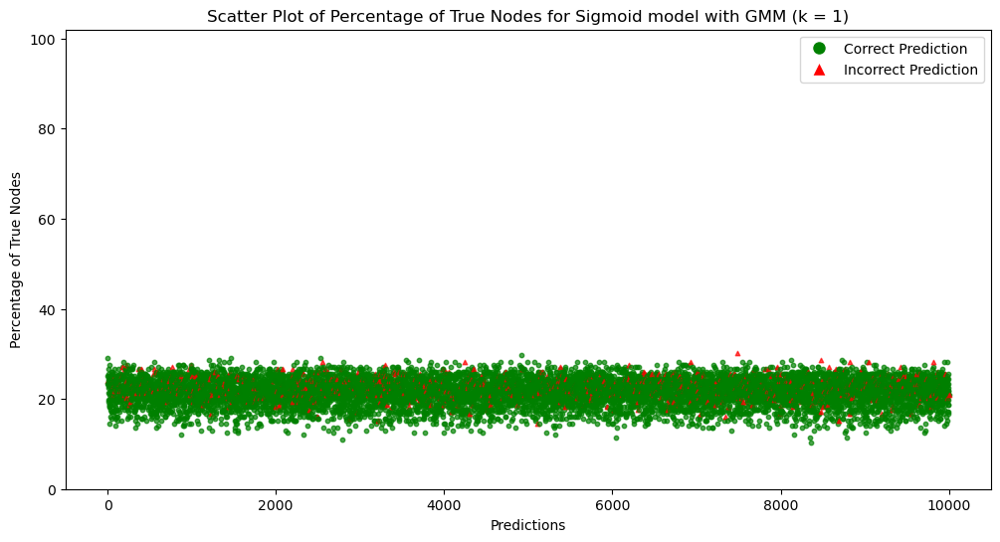

rang [0.3569100879520346, 0.6888719623902604] value 0.53874624
rang [-0.09896036590304153, 0.8132418026381658] value 0.19522998
rang [0.3881775267285913, 0.6870454427136466] value 0.8560143
rang [0.06614920353960141, 0.2606313866181959] value 0.8560143
rang [0.7258662524790038, 0.9505125650467134] value 0.8560143
Model Accuracy = 93.49%


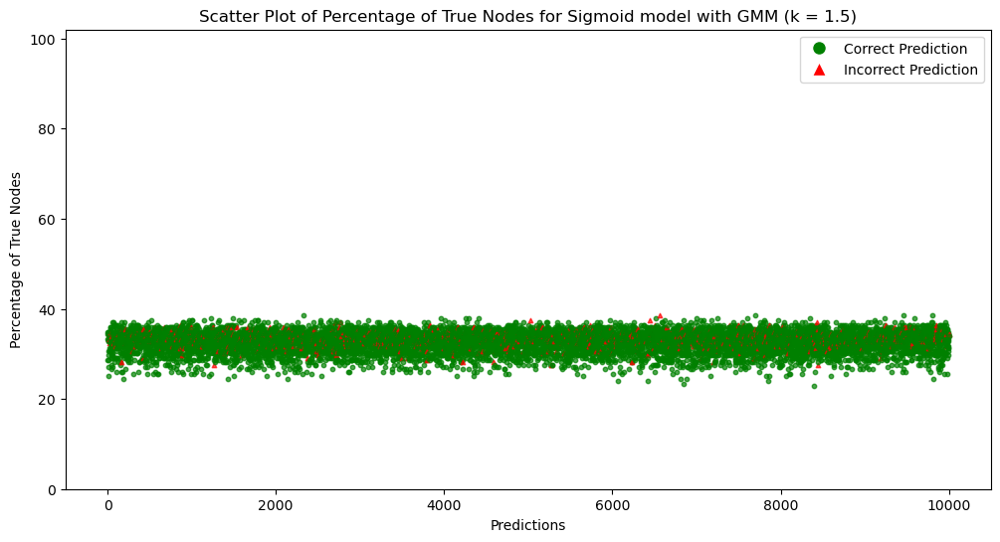

rang [0.301583108878997, 0.744198941463298] value 0.47265878
rang [-0.2509940606599094, 0.9652754973950337] value 0.14603473
rang [0.33836620739774875, 0.7368567620444892] value 0.18869533
rang [0.03373550635983566, 0.2930450837979617] value 0.18869533
rang [0.6884252003843855, 0.9879536171413318] value 0.18869533
Model Accuracy = 93.49%


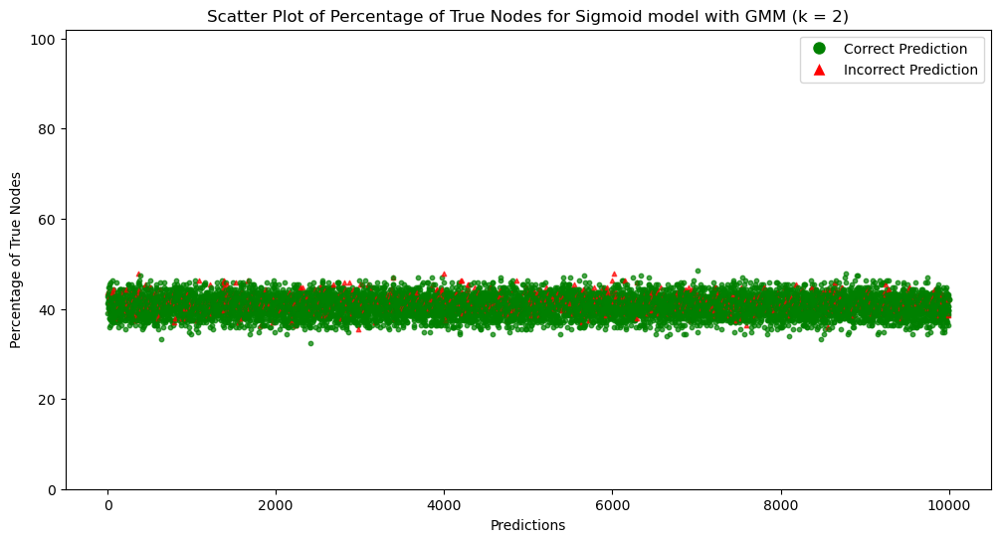

rang [0.2462561298059593, 0.7995259205363356] value 0.5158303
rang [-0.4030277554167773, 1.1173091921519016] value 0.037243616
rang [0.2885548880669062, 0.7866680813753317] value 0.84400076
rang [0.0013218091800699105, 0.3254587809777274] value 0.84400076
rang [0.6509841482897673, 1.0253946692359501] value 0.84400076
Model Accuracy = 93.49%


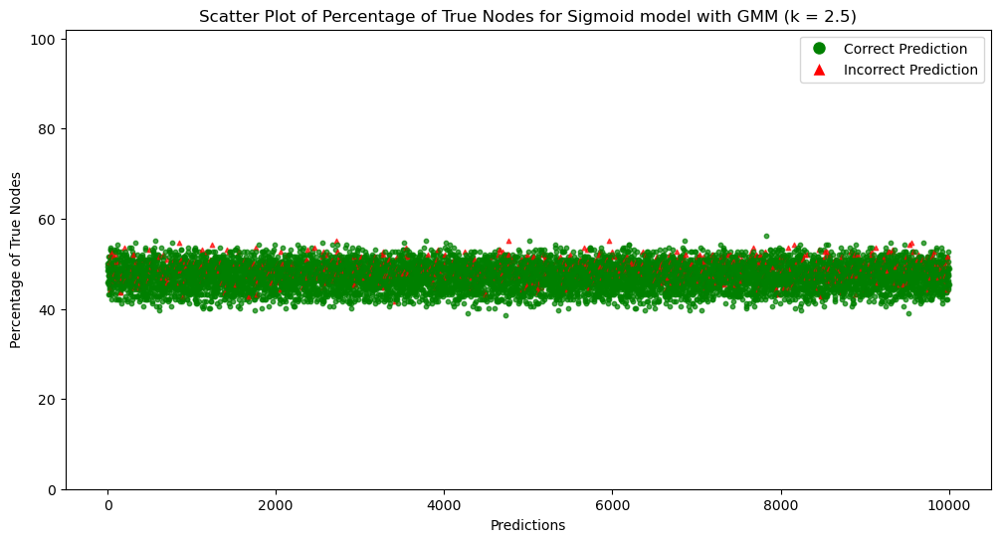

rang [0.19092915073292166, 0.8548528996093734] value 0.46424103
rang [-0.5550614501736453, 1.2693428869087695] value 0.13686566
rang [0.23874356873606362, 0.8364794007061743] value 0.10560773
rang [-0.03109188799969584, 0.3578724781574931] value 0.10560773
rang [0.6135430961951489, 1.0628357213305684] value 0.10560773
Model Accuracy = 93.49%


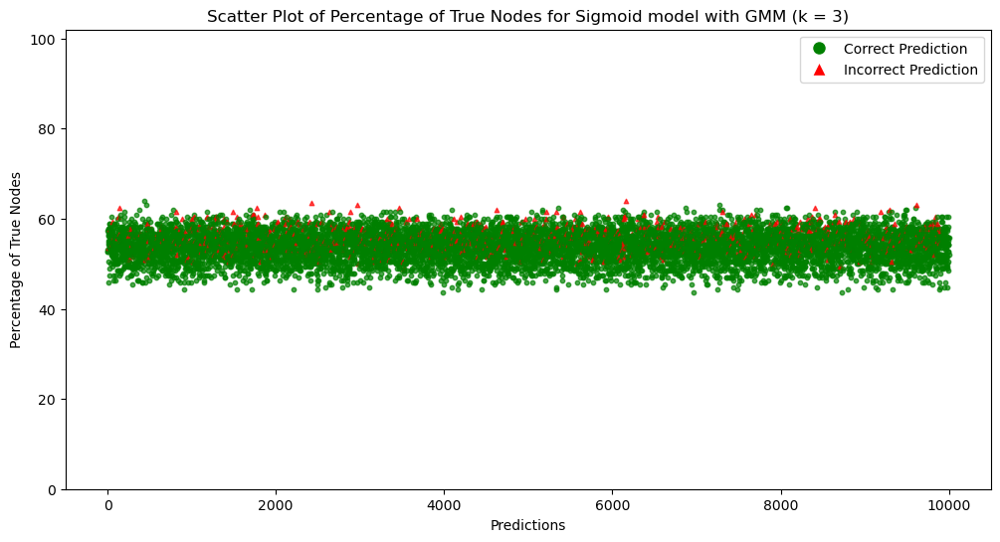

k =  0.5 has correlation -0.08797824887848174 and pvalue 1.2095325775499482e-18
k =  1 has correlation -0.09585828686919139 and pvalue 7.486872078982649e-22
k =  1.5 has correlation -0.07742836674825297 and pvalue 8.938666669463093e-15
k =  2 has correlation -0.11356412521754823 and pvalue 4.590733446417521e-30
k =  2.5 has correlation -0.14955140974777859 and pvalue 4.1442632308670484e-51
k =  3 has correlation -0.1642159022642577 and pvalue 2.1628704913253402e-61


In [60]:
correlation_list = []
k_list = [0.5,1,1.5,2,2.5,3]
for k in k_list:
    accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list = evaluate_model_gmm(model_sigmoid,
                                                                                         best_models_by_node,
                                                                                         valloader,
                                                                                         n_std=k)
    print(f"Model Accuracy = {accuracy_sigmoid * 100}%")
    plot_percentage_scatter(percent_list_sigmoid, prediction_list_sigmoid, num_points=None, ymin=0, ymax=102,
                           title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM (k = {k})")
    r_pb, p_value = pointbiserialr(prediction_list_sigmoid, percent_list_sigmoid)
    correlation_list.append((r_pb, p_value))

for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

We now try the same but just for $k$=10


In [62]:
from sklearn.mixture import GaussianMixture

# Assuming you have already defined model_sigmoid and imported necessary libraries

# Define the range of components
k_arr = np.array([10])

# Initialize an array to store GMM models for each node and each value of k
models_by_node = []

# Iterate over nodes
for node_key in model_sigmoid.node_dict["Layer2"].keys():
    X = np.array(model_sigmoid.node_dict["Layer2"][node_key]).reshape(-1, 1)
    
    # Initialize an array to store GMM models for this node
    models_for_node = []
    
    # Fit GMMs for different values of k
    for k in k_arr:
        gmm = GaussianMixture(n_components=k).fit(X)
        models_for_node.append(gmm)
    
    # Append the models for this node to the overall list
    models_by_node.append(models_for_node)

# # Plotting
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for models_for_node, ax_row in zip(models_by_node, axes):
#     for gmm, ax in zip(models_for_node, ax_row):
#         plot_mixture(gmm, X, show_legend=False, ax=ax)
#         ax.set_title(f'k={gmm.n_components}')
# plt.tight_layout()

# Compute AIC and BIC for each model
AIC_by_node = []
BIC_by_node = []
for models_for_node in models_by_node:
    AIC_for_node = [m.aic(X) for m in models_for_node]
    BIC_for_node = [m.bic(X) for m in models_for_node]
    AIC_by_node.append(AIC_for_node)
    BIC_by_node.append(BIC_for_node)
    
# Find the best models based on AIC
best_models_by_node = [models[np.argmin(AIC_node)] for models, AIC_node in zip(models_by_node, AIC_by_node)]

# # Plot AIC and BIC
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for AIC_node, BIC_node, ax_row in zip(AIC_by_node, BIC_by_node, axes):
#     ax_row[0].plot(k_arr, AIC_node, label='AIC')
#     ax_row[1].plot(k_arr, BIC_node, label='BIC')
#     for ax in ax_row:
#         ax.set_xlabel('Number of Components ($k$)')
#         ax.legend()
# plt.tight_layout()



# # Plot the best models
# fig, axes = plt.subplots(5, 3, figsize=(15, 15), dpi=100)
# for best_model, ax_row in zip(best_models_by_node, axes):
#     plot_mixture(best_model, X, ax=ax_row[0])
#     ax_row[0].set_title(f'Best Model (k={best_model.n_components})')
# plt.tight_layout()





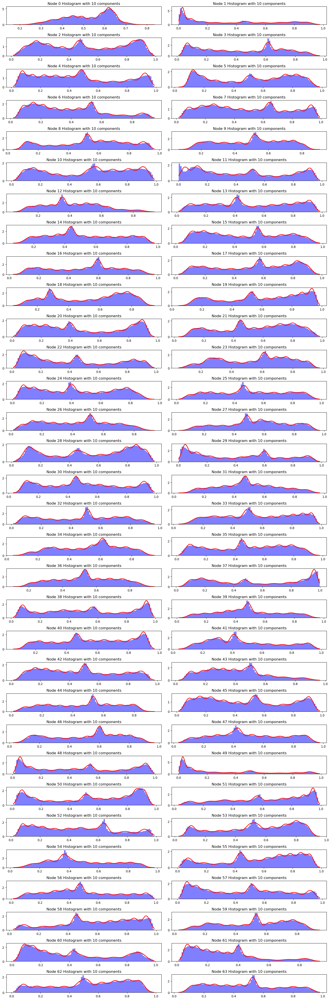

In [63]:
fig, axes = plt.subplots(32, 2, figsize=(15, 45), dpi=100)
axes = axes.flatten()  
for i, (models_for_node, ax) in enumerate(zip(models_by_node, axes)):
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    best_model = best_models_by_node[i]
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

plt.tight_layout()
plt.show()

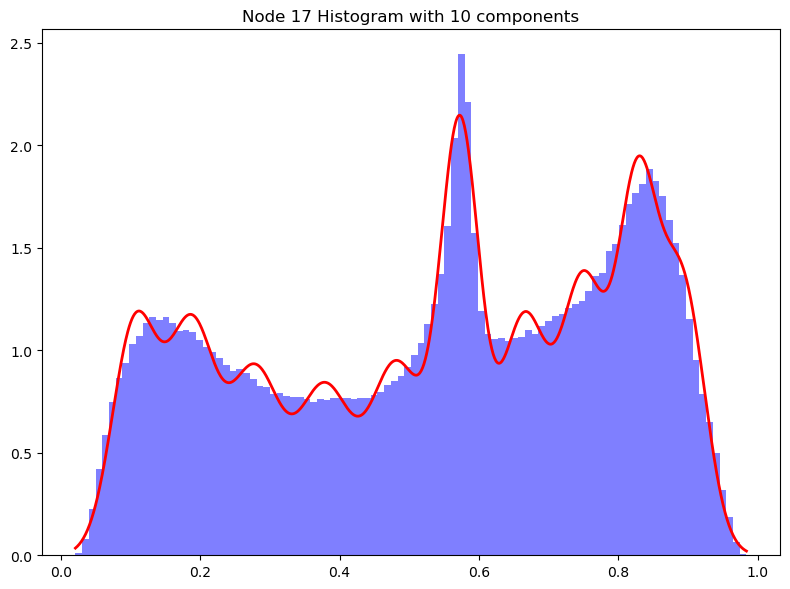

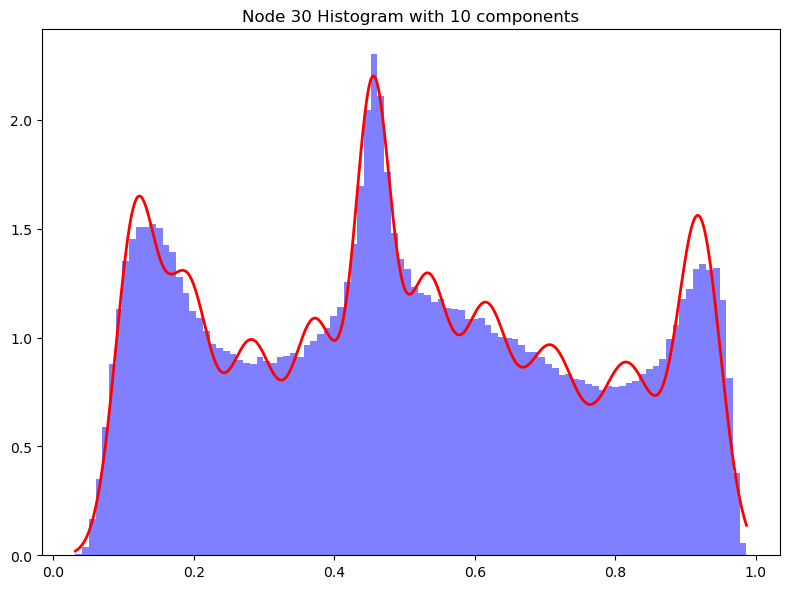

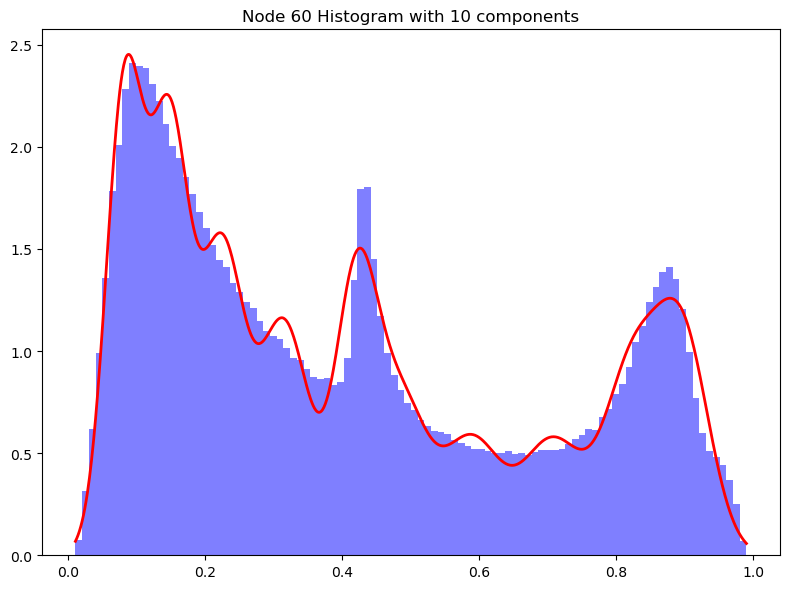

In [65]:
l = [17, 30, 60]

for i in l:
    node_data = np.array(model_sigmoid.node_dict["Layer2"][f"node{i}"])
    best_model = best_models_by_node[i]

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(node_data, bins=100, density=True, alpha=0.5, color='b')
    x = np.linspace(node_data.min(), node_data.max(), 1000)
    ax.plot(x, np.exp(best_model.score_samples(x.reshape(-1, 1))), color='red', linewidth=2)
    ax.set_title(f'Node {i} Histogram with {best_model.n_components} components')

    plt.tight_layout()
    plt.show()

rang [0.48432318996004425, 0.5016222834550202] value 0.5922241
rang [0.6399901447195279, 0.6551251012956502] value 0.5922241
rang [0.2848567579205041, 0.31651138295893894] value 0.5922241
rang [0.5765451582278285, 0.5920809802306306] value 0.5922241
rang [0.3451379405618773, 0.36796351983147313] value 0.5922241
Model Accuracy = 93.49%


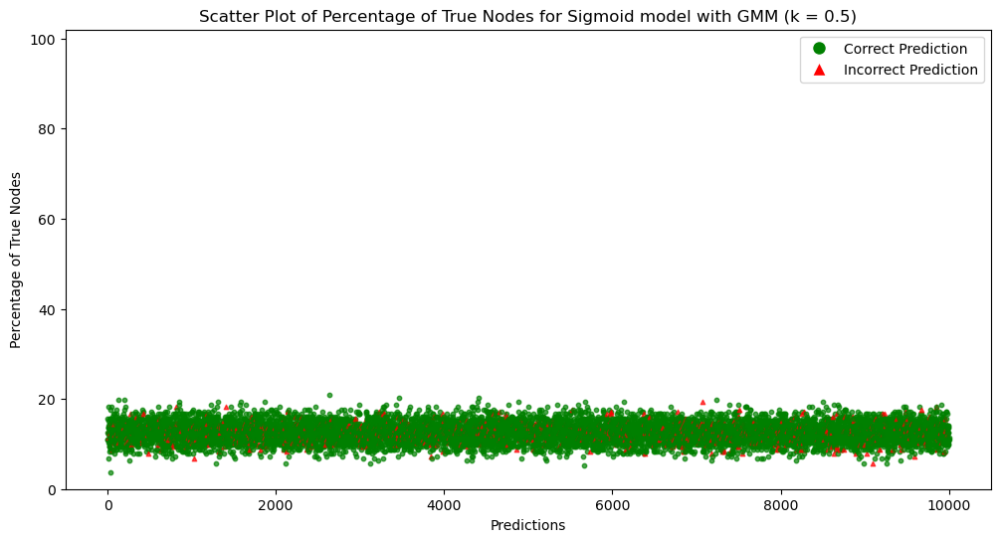

rang [0.47567364321255623, 0.5102718302025082] value 0.5092851
rang [0.6324226664314666, 0.6626925795837114] value 0.5092851
rang [0.2690294454012866, 0.3323386954781564] value 0.5092851
rang [0.5687772472264275, 0.5998488912320316] value 0.5092851
rang [0.33372515092707933, 0.3793763094662711] value 0.5092851
Model Accuracy = 93.49%


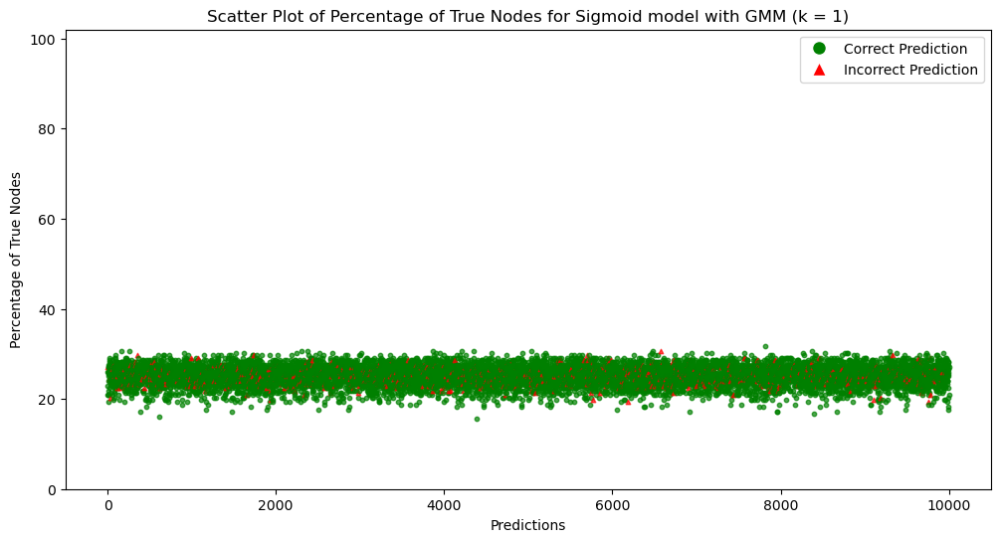

rang [0.46702409646506826, 0.5189213769499962] value 0.5604525
rang [0.6248551881434055, 0.6702600578717726] value 0.5604525
rang [0.25320213288206916, 0.34816600799737385] value 0.5604525
rang [0.5610093362250265, 0.6076168022334326] value 0.5604525
rang [0.3223123612922814, 0.390789099101069] value 0.5604525
Model Accuracy = 93.49%


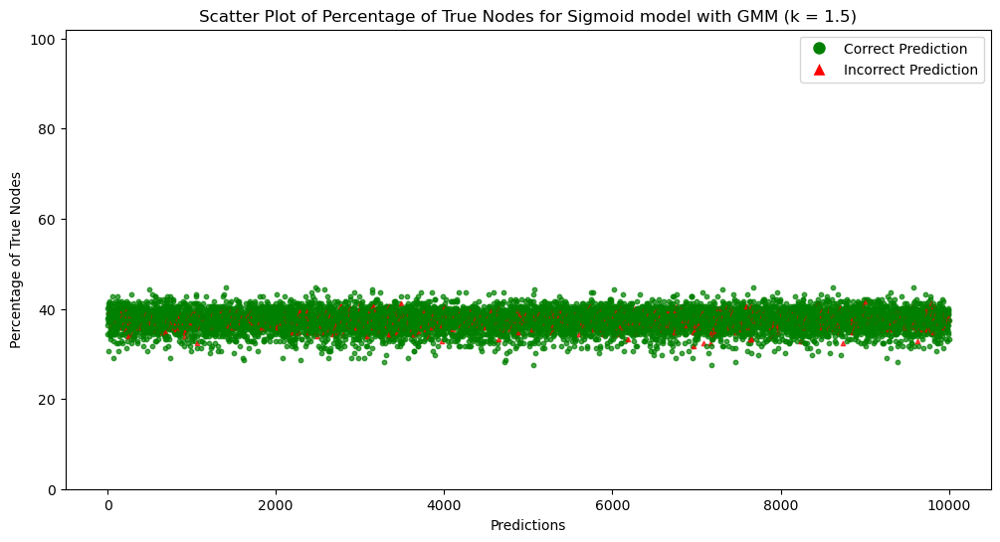

rang [0.4583745497175803, 0.5275709236974842] value 0.4371156
rang [0.6172877098553443, 0.6778275361598337] value 0.4371156
rang [0.2373748203628517, 0.3639933205165913] value 0.4371156
rang [0.5532414252236254, 0.6153847132348337] value 0.4371156
rang [0.31089957165748344, 0.402201888735867] value 0.4371156
Model Accuracy = 93.49%


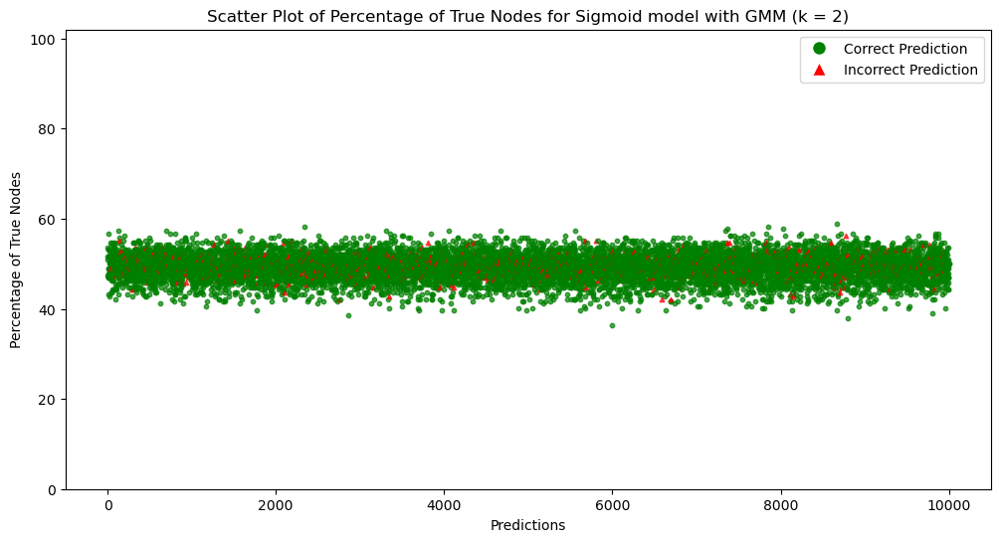

rang [0.4497250029700923, 0.5362204704449721] value 0.37961075
rang [0.609720231567283, 0.685395014447895] value 0.37961075
rang [0.22154750784363425, 0.37982063303580876] value 0.37961075
rang [0.5454735142222245, 0.6231526242362346] value 0.37961075
rang [0.2994867820226855, 0.4136146783706649] value 0.37961075
Model Accuracy = 93.49%


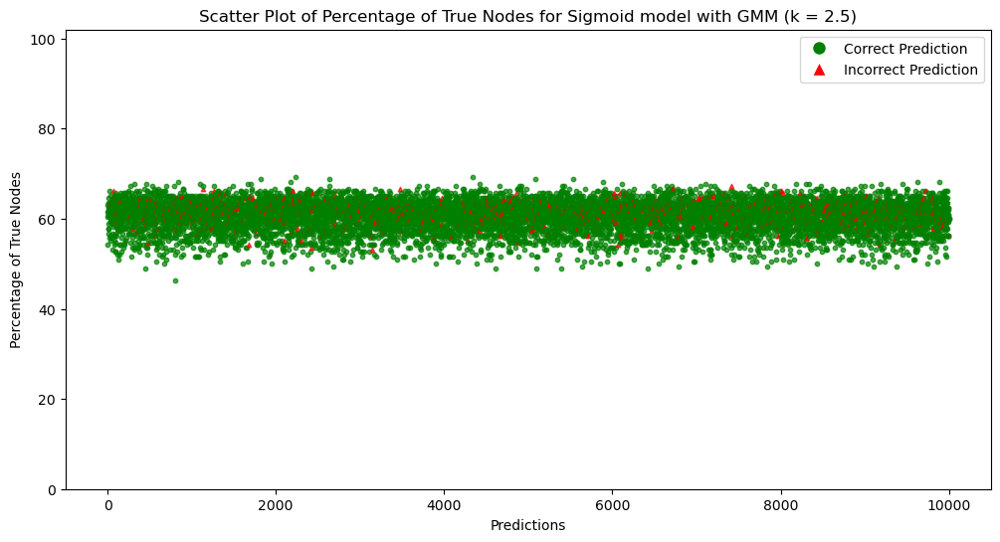

rang [0.4410754562226043, 0.5448700171924601] value 0.6379017
rang [0.6021527532792219, 0.6929624927359561] value 0.6379017
rang [0.20572019532441682, 0.3956479455550262] value 0.6379017
rang [0.5377056032208234, 0.6309205352376357] value 0.6379017
rang [0.28807399238788756, 0.42502746800546287] value 0.6379017
Model Accuracy = 93.49%


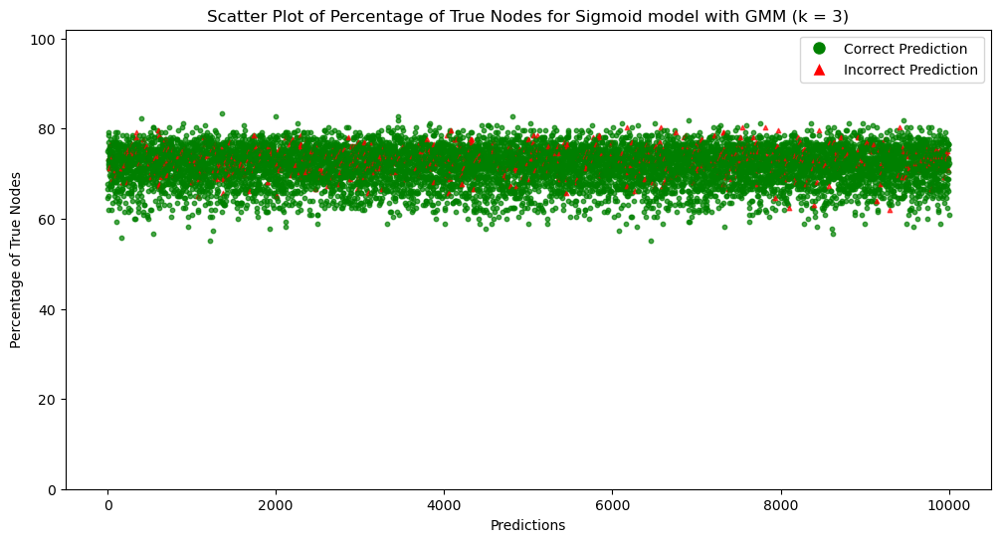

k =  0.5 has correlation 0.002730899948039895 and pvalue 0.7848098876538305
k =  1 has correlation 0.0033520172021492536 and pvalue 0.7375038214887168
k =  1.5 has correlation -0.004270967933303942 and pvalue 0.6693462962900052
k =  2 has correlation -0.03765048564708269 and pvalue 0.0001659415248965208
k =  2.5 has correlation -0.07467461270602763 and pvalue 7.605673673646479e-14
k =  3 has correlation -0.08590867558842606 and pvalue 7.584827492926905e-18


In [64]:
correlation_list = []
k_list = [0.5,1,1.5,2,2.5,3]
for k in k_list:
    accuracy_sigmoid, percent_list_sigmoid, prediction_list_sigmoid, probab_list = evaluate_model_gmm(model_sigmoid,
                                                                                         best_models_by_node,
                                                                                         valloader,
                                                                                         n_std=k)
    print(f"Model Accuracy = {accuracy_sigmoid * 100}%")
    plot_percentage_scatter(percent_list_sigmoid, prediction_list_sigmoid, num_points=None, ymin=0, ymax=102,
                           title = f"Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM (k = {k})")
    r_pb, p_value = pointbiserialr(prediction_list_sigmoid, percent_list_sigmoid)
    correlation_list.append((r_pb, p_value))

for i,k in enumerate(k_list):
    print(f"k =  {k} has correlation {correlation_list[i][0]} and pvalue {correlation_list[i][1]}")

In [86]:
accuracy_sigmoid_gmm, percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, probab_list_sigmoid_gmm = evaluate_model_gmm(model_sigmoid,
                                                                                                                         best_models_by_node,
                                                                                                                         valloader,
                                                                                                                         n_std=1)

rang [0.30492043424408033, 0.4615987141496438] value 0.9505898
rang [0.5537064371177833, 0.7297808943784125] value 0.9505898
rang [0.06780765116914902, 0.19151970764744938] value 0.9505898
rang [0.7819791414174875, 0.9175893270101365] value 0.9505898
rang [0.15431364267092545, 0.29522361234395356] value 0.611539


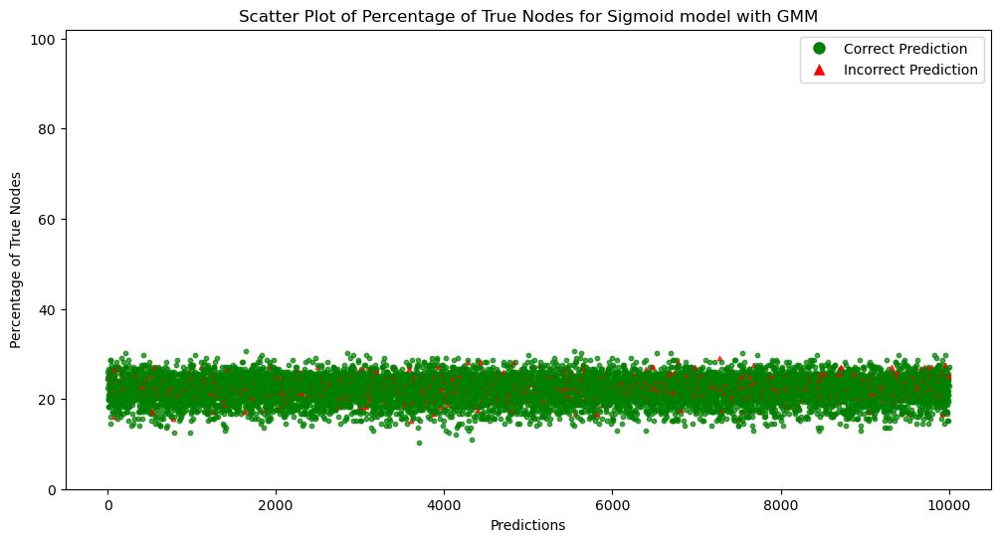

In [87]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=102,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

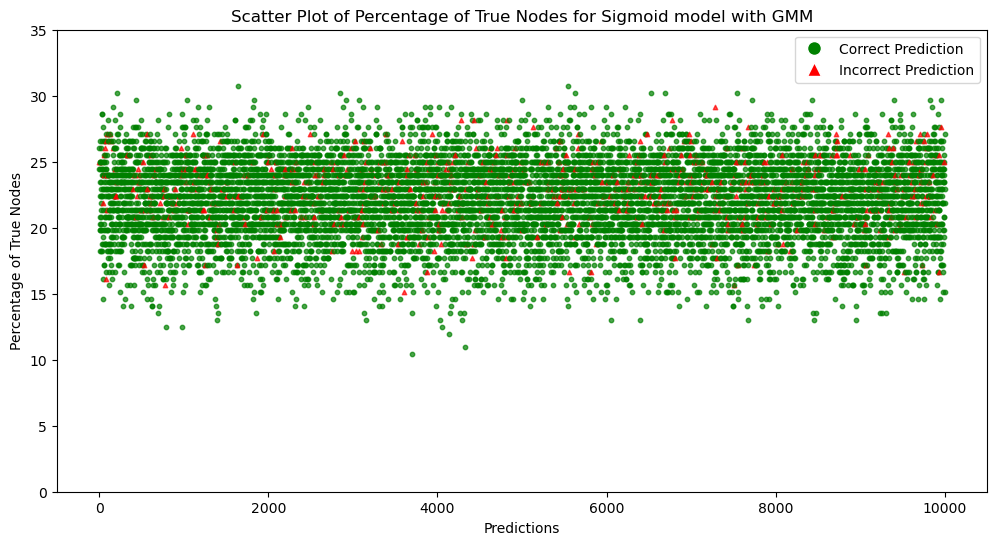

In [88]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=35,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

In [90]:
accuracy_sigmoid_gmm, percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, probab_list_sigmoid_gmm = evaluate_model_gmm(model_sigmoid,
                                                                                                                         best_models_by_node,
                                                                                                                         valloader,
                                                                                                                         n_std=2)

rang [0.22658129429129864, 0.5399378541024256] value 0.12970495
rang [0.4656692084874686, 0.8178181230087272] value 0.12970495
rang [0.005951622929998859, 0.25337573588659956] value 0.12970495
rang [0.714174048621163, 0.985394419806461] value 0.12970495
rang [0.0838586578344114, 0.3656785971804676] value 0.69334954


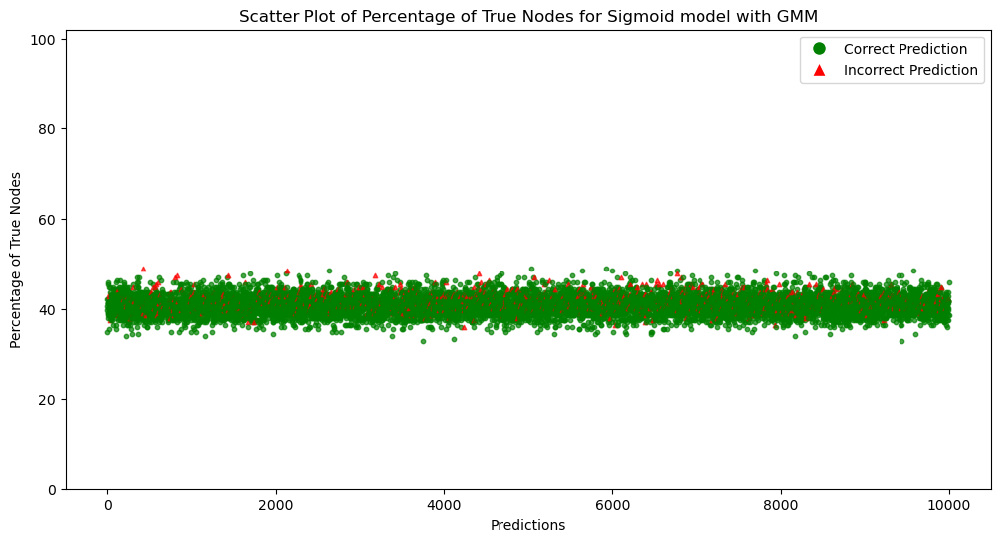

In [91]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=0, ymax=102,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

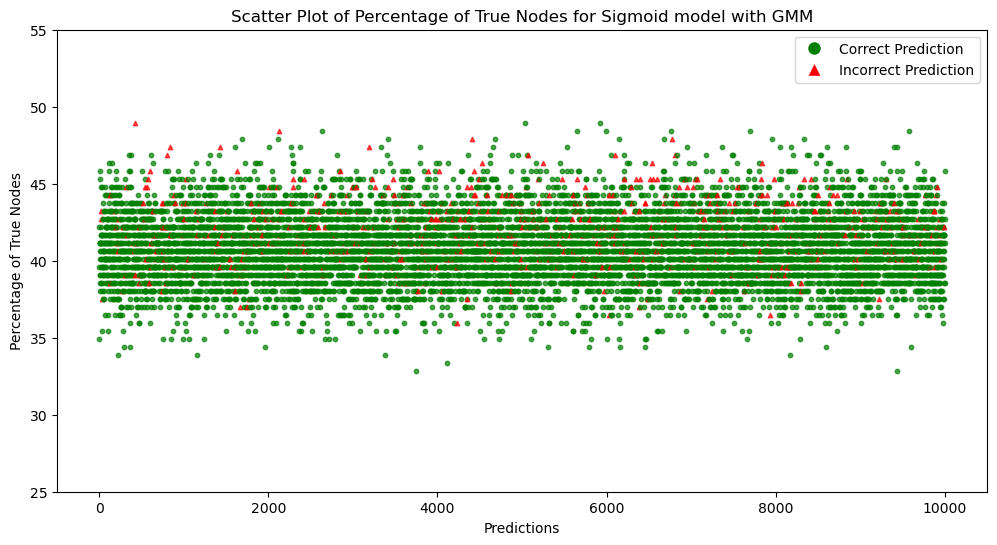

In [93]:
plot_percentage_scatter(percent_list_sigmoid_gmm, prediction_list_sigmoid_gmm, num_points=None, ymin=25, ymax=55,
                       title = "Scatter Plot of Percentage of True Nodes for Sigmoid model with GMM")

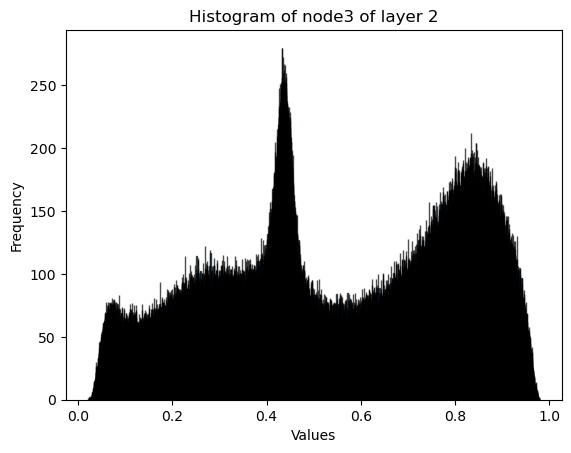

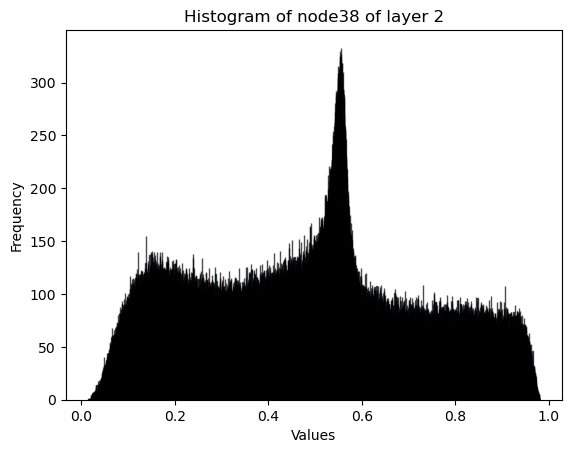

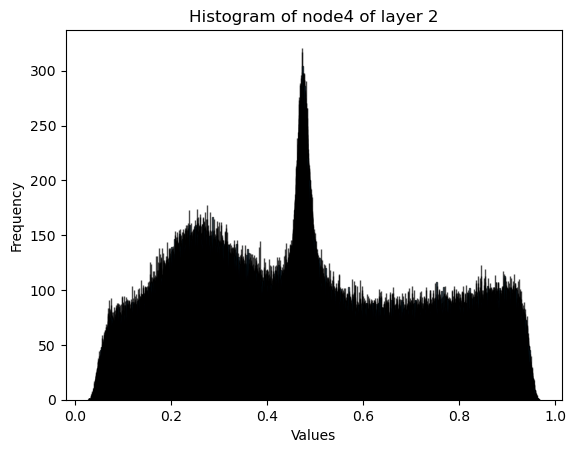

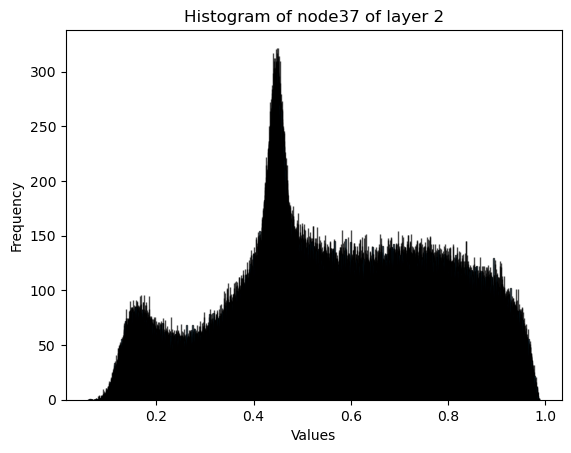

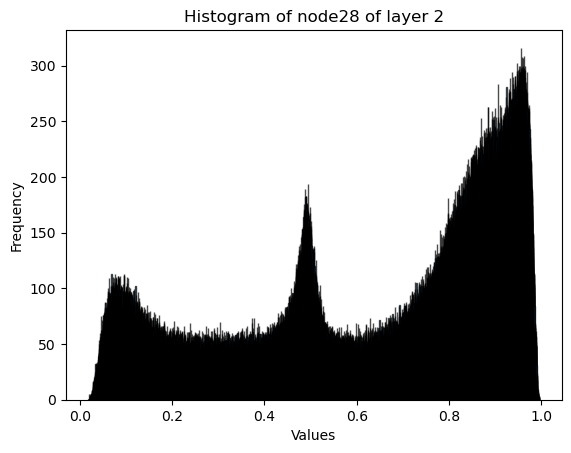

In [28]:
k_list = np.random.randint(0, 64, size=5)

for k in k_list:

        # Determine the range of data
        data_min = min(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        data_max = max(model_sigmoid.node_dict["Layer2"][f"node{k}"])
        step_size = 0.0001

        # Calculate the number of bins needed
        num_bins = int((data_max - data_min) / step_size) + 1

        # Generate bins with adjusted range and step size
        bins = np.linspace(data_min, data_max, num_bins)

        # Plot the histogram
        plt.hist(model_sigmoid.node_dict["Layer2"][f"node{k}"], bins=bins, edgecolor='black', alpha=0.7)

        # Set labels and title for the plot
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title(f'Histogram of node{k} of layer 2')

        # Show the plot
        plt.show()